In [4]:
import pypsa
import pickle 
import numpy as np
import pandas as pd
import os
from scipy import stats
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

from helper_functions import split_list, get_result_dict, plot_generator, plot_feature_array, plot_results, plot_all_results, plot_result, MAD, filter_dict
from helper_classes import ResultVectors, NetworkSplits, Experiment

plt.rcParams.update({'font.size': 28})
plt.rcParams["font.family"] = "Times New Roman"

In [5]:
%load_ext autoreload
%autoreload 2

In [6]:
colors = {'orange1': '#FF800E', 'orange2': '#C85200', 'orange3': '#FFBC79', 'orange4': '#A7886D', 
          'blue1': '#006BA4', 'blue2': '#5F9ED1', 'blue3': '#A2C8EC', 'blue4': '#3c6174',
          'grey1': '#ABABAB', 'grey2': '#595959', 'grey3': '#898989', 'grey4': '#CFCFCF'}

Import network split

In [5]:
split_keys = ['2m', '1w']
result_vectors = ResultVectors()
netw_splits = NetworkSplits()
for key in split_keys:
    result_vectors[key] = f'result_dict_{key}'
    netw_splits[key] = f'netw_split_{key}'

INFO:pypsa.io:Imported network 0.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network 1.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network 2.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network 3.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network 4.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network 5.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Imported network 6.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores
INFO:pypsa.io:Import

# Basic Information about the network model

In [7]:
n = pypsa.Network("networks/elec_s_80_ec_lcopt_Co2L-24H_2011_15.nc") # import the whole network

<frozen importlib._bootstrap>:241: RuntimeWarning: numpy.ndarray size changed, may indicate binary incompatibility. Expected 16 from C header, got 96 from PyObject
INFO:pypsa.io:Imported network elec_s_80_ec_lcopt_Co2L-24H_2011_15.nc has buses, carriers, generators, global_constraints, lines, links, loads, shapes, storage_units, stores


In [8]:
len(n.snapshots) # number of snapshots of the network

1826

c:\Users\csms\miniconda3\envs\bachelor-env\Lib\site-packages\cartopy\mpl\feature_artist.py:144: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


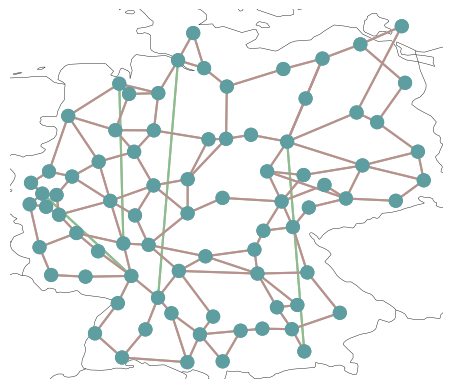

In [9]:
n.plot()
plt.savefig(f"plots/PyPSA-germany.pdf", format="pdf", bbox_inches="tight")

In [10]:
n.buses['x']['DE0 0'] # x position of the first generator

11.965484499999999

In [11]:
n.buses['y']['DE0 0'] # y position of the first generator

51.467240000000004

In [14]:
n.optimize(solver_name="gurobi") # optimizing the whole network

INFO:linopy.model: Solve problem using Gurobi solver


Set parameter Username


INFO:gurobipy:Set parameter Username


Academic license - for non-commercial use only - expires 2025-05-02


INFO:gurobipy:Academic license - for non-commercial use only - expires 2025-05-02
INFO:linopy.io:Writing objective.
Writing continuous variables.: 100%|██████████| 14/14 [00:10<00:00,  1.38it/s]
INFO:linopy.io: Writing time: 77.05s


Read LP format model from file C:\Users\csms\AppData\Local\Temp\linopy-problem-k5rg3z20.lp


INFO:gurobipy:Read LP format model from file C:\Users\csms\AppData\Local\Temp\linopy-problem-k5rg3z20.lp


Reading time = 23.73 seconds


INFO:gurobipy:Reading time = 23.73 seconds


obj: 6382676 rows, 3002615 columns, 13840913 nonzeros


INFO:gurobipy:obj: 6382676 rows, 3002615 columns, 13840913 nonzeros


Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:Gurobi Optimizer version 11.0.1 build v11.0.1rc0 (win64 - Windows 10.0 (19045.2))


INFO:gurobipy:


CPU model: AMD Ryzen 5 2600 Six-Core Processor, instruction set [SSE2|AVX|AVX2]


INFO:gurobipy:CPU model: AMD Ryzen 5 2600 Six-Core Processor, instruction set [SSE2|AVX|AVX2]


Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:Thread count: 6 physical cores, 12 logical processors, using up to 12 threads


INFO:gurobipy:


Optimize a model with 6382676 rows, 3002615 columns and 13840913 nonzeros


INFO:gurobipy:Optimize a model with 6382676 rows, 3002615 columns and 13840913 nonzeros


Model fingerprint: 0xb64e5091


INFO:gurobipy:Model fingerprint: 0xb64e5091


Coefficient statistics:


INFO:gurobipy:Coefficient statistics:


  Matrix range     [5e-01, 7e+01]


INFO:gurobipy:  Matrix range     [5e-01, 7e+01]


  Objective range  [2e-01, 6e+05]


INFO:gurobipy:  Objective range  [2e-01, 6e+05]


  Bounds range     [2e+10, 2e+10]


INFO:gurobipy:  Bounds range     [2e+10, 2e+10]


  RHS range        [1e-01, 1e+10]


INFO:gurobipy:  RHS range        [1e-01, 1e+10]


INFO:gurobipy:Warning: Model contains large rhs


INFO:gurobipy:Warning: Model contains large bounds


         Consider reformulating model or setting NumericFocus parameter


INFO:gurobipy:         Consider reformulating model or setting NumericFocus parameter


         to avoid numerical issues.


INFO:gurobipy:         to avoid numerical issues.


Presolve removed 3724544 rows and 830000 columns (presolve time = 5s) ...


INFO:gurobipy:Presolve removed 3724544 rows and 830000 columns (presolve time = 5s) ...


Presolve removed 4009397 rows and 1109378 columns (presolve time = 10s) ...


INFO:gurobipy:Presolve removed 4009397 rows and 1109378 columns (presolve time = 10s) ...


Presolve removed 4009692 rows and 1109378 columns (presolve time = 15s) ...


INFO:gurobipy:Presolve removed 4009692 rows and 1109378 columns (presolve time = 15s) ...


Presolve removed 4009692 rows and 1109378 columns


INFO:gurobipy:Presolve removed 4009692 rows and 1109378 columns


Presolve time: 33.30s


INFO:gurobipy:Presolve time: 33.30s


Presolved: 2372984 rows, 1893237 columns, 9056564 nonzeros


INFO:gurobipy:Presolved: 2372984 rows, 1893237 columns, 9056564 nonzeros


INFO:gurobipy:


Concurrent LP optimizer: primal simplex, dual simplex, and barrier


INFO:gurobipy:Concurrent LP optimizer: primal simplex, dual simplex, and barrier


Showing barrier log only...


INFO:gurobipy:Showing barrier log only...


INFO:gurobipy:


Elapsed ordering time = 6s


INFO:gurobipy:Elapsed ordering time = 6s


Elapsed ordering time = 10s


INFO:gurobipy:Elapsed ordering time = 10s


Elapsed ordering time = 20s


INFO:gurobipy:Elapsed ordering time = 20s


Elapsed ordering time = 25s


INFO:gurobipy:Elapsed ordering time = 25s


Ordering time: 43.42s


INFO:gurobipy:Ordering time: 43.42s


INFO:gurobipy:


Barrier statistics:


INFO:gurobipy:Barrier statistics:


 Dense cols : 665


INFO:gurobipy: Dense cols : 665


 Free vars  : 158775


INFO:gurobipy: Free vars  : 158775


 AA' NZ     : 1.429e+07


INFO:gurobipy: AA' NZ     : 1.429e+07


 Factor NZ  : 2.545e+08 (roughly 4.0 GB of memory)


INFO:gurobipy: Factor NZ  : 2.545e+08 (roughly 4.0 GB of memory)


 Factor Ops : 2.484e+11 (roughly 7 seconds per iteration)


INFO:gurobipy: Factor Ops : 2.484e+11 (roughly 7 seconds per iteration)


 Threads    : 4


INFO:gurobipy: Threads    : 4


INFO:gurobipy:


                  Objective                Residual


INFO:gurobipy:                  Objective                Residual


Iter       Primal          Dual         Primal    Dual     Compl     Time


INFO:gurobipy:Iter       Primal          Dual         Primal    Dual     Compl     Time


   0   3.07330573e+15 -7.55692789e+14  1.17e+12 4.26e+04  5.77e+11    94s


INFO:gurobipy:   0   3.07330573e+15 -7.55692789e+14  1.17e+12 4.26e+04  5.77e+11    94s


   1   2.93778400e+15 -4.93448240e+14  8.17e+11 1.18e+04  2.39e+11   102s


INFO:gurobipy:   1   2.93778400e+15 -4.93448240e+14  8.17e+11 1.18e+04  2.39e+11   102s


   2   2.81412117e+15 -8.07110962e+14  6.43e+11 4.25e+03  1.88e+11   110s


INFO:gurobipy:   2   2.81412117e+15 -8.07110962e+14  6.43e+11 4.25e+03  1.88e+11   110s


   3   2.17574579e+15 -9.11284766e+14  6.21e+10 3.07e+03  2.00e+10   120s


INFO:gurobipy:   3   2.17574579e+15 -9.11284766e+14  6.21e+10 3.07e+03  2.00e+10   120s


   4   1.14447006e+15 -8.90277873e+14  5.76e+09 3.06e+03  2.11e+09   130s


INFO:gurobipy:   4   1.14447006e+15 -8.90277873e+14  5.76e+09 3.06e+03  2.11e+09   130s


   5   1.19998557e+14 -5.15763352e+14  3.36e+08 8.59e+03  2.34e+08   142s


INFO:gurobipy:   5   1.19998557e+14 -5.15763352e+14  3.36e+08 8.59e+03  2.34e+08   142s


   6   2.80106264e+13 -9.33213345e+13  5.76e+07 6.69e+02  3.78e+07   153s


INFO:gurobipy:   6   2.80106264e+13 -9.33213345e+13  5.76e+07 6.69e+02  3.78e+07   153s


   7   1.02518374e+13 -4.16392720e+13  3.56e+06 2.88e+02  1.34e+07   162s


INFO:gurobipy:   7   1.02518374e+13 -4.16392720e+13  3.56e+06 2.88e+02  1.34e+07   162s


   8   7.08601168e+12 -8.48207662e+12  1.53e+06 6.55e+01  3.99e+06   171s


INFO:gurobipy:   8   7.08601168e+12 -8.48207662e+12  1.53e+06 6.55e+01  3.99e+06   171s


   9   5.32975512e+12 -8.26504813e+12  1.20e+04 6.41e+01  3.44e+06   179s


INFO:gurobipy:   9   5.32975512e+12 -8.26504813e+12  1.20e+04 6.41e+01  3.44e+06   179s


  10   2.92454903e+12 -3.46963617e+12  7.35e+03 2.61e+01  1.61e+06   189s


INFO:gurobipy:  10   2.92454903e+12 -3.46963617e+12  7.35e+03 2.61e+01  1.61e+06   189s


  11   1.21773114e+12 -1.04356114e+12  2.72e+03 7.76e+00  5.62e+05   198s


INFO:gurobipy:  11   1.21773114e+12 -1.04356114e+12  2.72e+03 7.76e+00  5.62e+05   198s


  12   5.67719807e+11 -1.81783998e+11  1.14e+03 1.39e+00  1.85e+05   208s


INFO:gurobipy:  12   5.67719807e+11 -1.81783998e+11  1.14e+03 1.39e+00  1.85e+05   208s


  13   3.59572527e+11 -2.44082083e+10  6.71e+02 5.25e+01  9.46e+04   218s


INFO:gurobipy:  13   3.59572527e+11 -2.44082083e+10  6.71e+02 5.25e+01  9.46e+04   218s


  14   2.67681011e+11 -2.94163292e+09  5.03e+02 2.10e+01  6.66e+04   227s


INFO:gurobipy:  14   2.67681011e+11 -2.94163292e+09  5.03e+02 2.10e+01  6.66e+04   227s


  15   1.97832884e+11  5.87235703e+09  3.68e+02 1.07e+01  4.73e+04   243s


INFO:gurobipy:  15   1.97832884e+11  5.87235703e+09  3.68e+02 1.07e+01  4.73e+04   243s


  16   1.55135048e+11  9.73771976e+09  2.82e+02 7.44e+00  3.58e+04   257s


INFO:gurobipy:  16   1.55135048e+11  9.73771976e+09  2.82e+02 7.44e+00  3.58e+04   257s


  17   1.28268554e+11  1.25273396e+10  2.27e+02 5.37e+00  2.85e+04   270s


INFO:gurobipy:  17   1.28268554e+11  1.25273396e+10  2.27e+02 5.37e+00  2.85e+04   270s


  18   1.12069677e+11  1.37661491e+10  1.94e+02 4.59e+00  2.42e+04   281s


INFO:gurobipy:  18   1.12069677e+11  1.37661491e+10  1.94e+02 4.59e+00  2.42e+04   281s


  19   9.87847236e+10  1.67052584e+10  1.66e+02 3.07e+00  2.02e+04   295s


INFO:gurobipy:  19   9.87847236e+10  1.67052584e+10  1.66e+02 3.07e+00  2.02e+04   295s


  20   7.98042981e+10  1.90021361e+10  1.26e+02 2.09e+00  1.50e+04   308s


INFO:gurobipy:  20   7.98042981e+10  1.90021361e+10  1.26e+02 2.09e+00  1.50e+04   308s


  21   6.94147050e+10  2.04221830e+10  1.03e+02 1.53e+00  1.21e+04   323s


INFO:gurobipy:  21   6.94147050e+10  2.04221830e+10  1.03e+02 1.53e+00  1.21e+04   323s


  22   6.19364313e+10  2.11428295e+10  8.55e+01 1.29e+00  1.00e+04   336s


INFO:gurobipy:  22   6.19364313e+10  2.11428295e+10  8.55e+01 1.29e+00  1.00e+04   336s


  23   5.16778723e+10  2.20355815e+10  6.18e+01 9.83e-01  7.30e+03   351s


INFO:gurobipy:  23   5.16778723e+10  2.20355815e+10  6.18e+01 9.83e-01  7.30e+03   351s


  24   4.54315401e+10  2.28873304e+10  4.69e+01 7.33e-01  5.55e+03   364s


INFO:gurobipy:  24   4.54315401e+10  2.28873304e+10  4.69e+01 7.33e-01  5.55e+03   364s


  25   4.25325277e+10  2.33417871e+10  4.00e+01 6.08e-01  4.72e+03   379s


INFO:gurobipy:  25   4.25325277e+10  2.33417871e+10  4.00e+01 6.08e-01  4.72e+03   379s


  26   3.83415719e+10  2.38442261e+10  3.01e+01 4.73e-01  3.57e+03   392s


INFO:gurobipy:  26   3.83415719e+10  2.38442261e+10  3.01e+01 4.73e-01  3.57e+03   392s


  27   3.62847303e+10  2.41884738e+10  2.51e+01 3.82e-01  2.98e+03   405s


INFO:gurobipy:  27   3.62847303e+10  2.41884738e+10  2.51e+01 3.82e-01  2.98e+03   405s


KeyboardInterrupt: 

Exception ignored in: 'gurobipy.logcallbackstub'
Traceback (most recent call last):
  File "c:\Users\csms\miniconda3\envs\bachelor-env\Lib\site-packages\ipykernel\iostream.py", line 655, in write
    def write(self, string: str) -> Optional[int]:  # type:ignore[override]

KeyboardInterrupt: 


  29   3.19506671e+10  2.47668617e+10  1.51e+01 2.32e-01  1.77e+03   435s


INFO:gurobipy:  29   3.19506671e+10  2.47668617e+10  1.51e+01 2.32e-01  1.77e+03   435s


  30   3.07955703e+10  2.50177778e+10  1.23e+01 1.69e-01  1.42e+03   449s


INFO:gurobipy:  30   3.07955703e+10  2.50177778e+10  1.23e+01 1.69e-01  1.42e+03   449s


  31   2.95835147e+10  2.51907302e+10  9.36e+00 1.26e-01  1.08e+03   463s


INFO:gurobipy:  31   2.95835147e+10  2.51907302e+10  9.36e+00 1.26e-01  1.08e+03   463s


  32   2.85457574e+10  2.53100345e+10  6.78e+00 9.76e-02  7.97e+02   477s


INFO:gurobipy:  32   2.85457574e+10  2.53100345e+10  6.78e+00 9.76e-02  7.97e+02   477s


  33   2.77160418e+10  2.53474701e+10  4.90e+00 8.86e-02  5.83e+02   491s


INFO:gurobipy:  33   2.77160418e+10  2.53474701e+10  4.90e+00 8.86e-02  5.83e+02   491s


  34   2.71981301e+10  2.54739717e+10  3.59e+00 6.00e-02  4.24e+02   505s


INFO:gurobipy:  34   2.71981301e+10  2.54739717e+10  3.59e+00 6.00e-02  4.24e+02   505s


  35   2.67920782e+10  2.55734777e+10  2.57e+00 3.74e-02  3.00e+02   519s


INFO:gurobipy:  35   2.67920782e+10  2.55734777e+10  2.57e+00 3.74e-02  3.00e+02   519s


  36   2.65091950e+10  2.56149652e+10  1.87e+00 2.79e-02  2.20e+02   533s


INFO:gurobipy:  36   2.65091950e+10  2.56149652e+10  1.87e+00 2.79e-02  2.20e+02   533s


  37   2.63573462e+10  2.56418433e+10  1.48e+00 2.14e-02  1.76e+02   545s


INFO:gurobipy:  37   2.63573462e+10  2.56418433e+10  1.48e+00 2.14e-02  1.76e+02   545s


  38   2.62433693e+10  2.56530667e+10  1.21e+00 1.86e-02  1.45e+02   558s


INFO:gurobipy:  38   2.62433693e+10  2.56530667e+10  1.21e+00 1.86e-02  1.45e+02   558s


  39   2.60555748e+10  2.56735107e+10  7.54e-01 1.35e-02  9.41e+01   572s


INFO:gurobipy:  39   2.60555748e+10  2.56735107e+10  7.54e-01 1.35e-02  9.41e+01   572s


  40   2.60026905e+10  2.56874347e+10  6.29e-01 1.04e-02  7.76e+01   585s


INFO:gurobipy:  40   2.60026905e+10  2.56874347e+10  6.29e-01 1.04e-02  7.76e+01   585s


  41   2.59620572e+10  2.57029774e+10  5.32e-01 6.82e-03  6.38e+01   598s


INFO:gurobipy:  41   2.59620572e+10  2.57029774e+10  5.32e-01 6.82e-03  6.38e+01   598s


  42   2.58729326e+10  2.57173189e+10  3.20e-01 3.69e-03  3.83e+01   613s


INFO:gurobipy:  42   2.58729326e+10  2.57173189e+10  3.20e-01 3.69e-03  3.83e+01   613s


  43   2.58046436e+10  2.57252236e+10  1.56e-01 1.98e-03  1.96e+01   627s


INFO:gurobipy:  43   2.58046436e+10  2.57252236e+10  1.56e-01 1.98e-03  1.96e+01   627s


  44   2.57641923e+10  2.57302911e+10  5.99e-02 9.39e-04  8.35e+00   640s


INFO:gurobipy:  44   2.57641923e+10  2.57302911e+10  5.99e-02 9.39e-04  8.35e+00   640s


  45   2.57484605e+10  2.57335516e+10  2.66e-02 3.12e-04  3.67e+00   653s


INFO:gurobipy:  45   2.57484605e+10  2.57335516e+10  2.66e-02 3.12e-04  3.67e+00   653s


  46   2.57418109e+10  2.57343499e+10  1.27e-02 1.54e-04  1.84e+00   664s


INFO:gurobipy:  46   2.57418109e+10  2.57343499e+10  1.27e-02 1.54e-04  1.84e+00   664s


In [ ]:
n.statistics() # statistics of the whole network

In [ ]:
n.generators_t.p_max_pu 

# Create Network Split

In [ ]:
n = pypsa.Network("networks/elec_s_80_ec_lcopt_Co2L-24H_2011_15.nc") # importing the whole network

## ~ 2 Month

In [ ]:
snapshot_splits = split_list(list=n.snapshots, n=30)
netw_split_2m = []
for snapshot_split in snapshot_splits:
    netw_copy = n.copy()
    netw_copy.set_snapshots(snapshots=snapshot_split)
    netw_copy.optimize(snapshot_split, solver_name="gurobi")
    netw_split_2m.append(netw_copy)

Export network split:

In [ ]:
for i, netw in enumerate(netw_split_2m):
    netw.export_to_netcdf(path=f'netw_split_2m/{i}.nc')

Import network split:

In [ ]:
directory = os.fsencode('netw_split_2m')
n_files = len([f for f in os.listdir(directory)])
netw_split_2m = [pypsa.Network(f'netw_split_2m/{i}.nc') for i in range(n_files)]

Create and export result dictionary

In [ ]:
result_dict_2m = get_result_dict(netw_split_2m)
print(result_dict_2m)
with open('result_dict_2m.pkl', 'wb') as f:
    pickle.dump(result_dict_2m, f)

## ~ 1 week

In [ ]:
snapshot_splits = split_list(list=n.snapshots, n=260)
netw_split_1w = []
for snapshot_split in snapshot_splits:
    netw_copy = n.copy()
    netw_copy.set_snapshots(snapshots=snapshot_split)
    netw_copy.optimize(snapshot_split, solver_name="gurobi")
    netw_split_1w.append(netw_copy)

Export network split:

In [ ]:
for i, netw in enumerate(netw_split_1w):
    netw.export_to_netcdf(path=f'netw_split_1w/{i}.nc')

Import network split:

In [ ]:
directory = os.fsencode('netw_split_1w')
n_files = len([f for f in os.listdir(directory)])
netw_split_1w = [pypsa.Network(f'netw_split_1w/{i}.nc') for i in range(n_files)]

Create and export result dictionary

In [ ]:
result_dict_1w = get_result_dict(netw_split_1w)
with open('result_dict_1w.pkl', 'wb') as f:
    pickle.dump(result_dict_1w, f)

In [ ]:
plot_generator(netw_split_1w, 'DE0 0 onwind')

# Analyzing the Target Vector

In [ ]:
results = [[np.mean(netw.statistics()[column]) for column in netw.statistics()] for netw in netw_splits]

In [ ]:
result_keys = [column for column in n.statistics()]

In [ ]:
result_features = np.array(results).T
for i, y in enumerate(result_features):
    plt.plot(np.arange(len(y)), stats.zscore(y), label=result_keys[i])
plt.legend()
plt.show()

In [ ]:
def plot_result_array(i):
    plt.plot(np.arange(len(result_features[i])), stats.zscore(result_features[i]), label=result_keys[i])
    plt.show()
plot_result_array(0)

In [ ]:


var = [MAD(stats.zscore(result)) for result in result_features]
print(var)
sorted_var = np.argsort(var)
for i in sorted_var:
    print(f"{i}: {result_keys[i]} | {var[i]}")

# Experiments

## simple (Generator Types)

Create and run Experiment:

In [30]:
simple_experiment = Experiment('simple', netw_splits, result_vectors)

feature_names = ['solar', 'onwind', 'offwind-ac', 'offwind-dc']
feature_colors = [colors['orange1'], colors['blue1'], colors['blue2'], colors['blue3']]

def get_feature(df: pd.DataFrame, search: str):
    filtered_df = df.filter(like=search, axis=1)
    return np.mean(np.array(filtered_df), axis=(0,1))

def get_features(netw: pypsa.Network, *args):
    feature_data = netw.generators_t.p_max_pu
    return [get_feature(feature_data, key_word) for key_word in feature_names]

simple_experiment.create_features(get_features, feature_names, feature_colors)

simple_experiment.run_algorithms()

Find the number of generators:

In [17]:
for name in feature_names:
    print(name, end=" & ")
for name in feature_names:
    print(len(n.generators_t.p_max_pu.filter(like=name, axis=1).columns), end=" & ")

solar & onwind & offwind-ac & offwind-dc & 80 & 80 & 10 & 4 & 

Generate plot over the maximal possible output of the generator types:

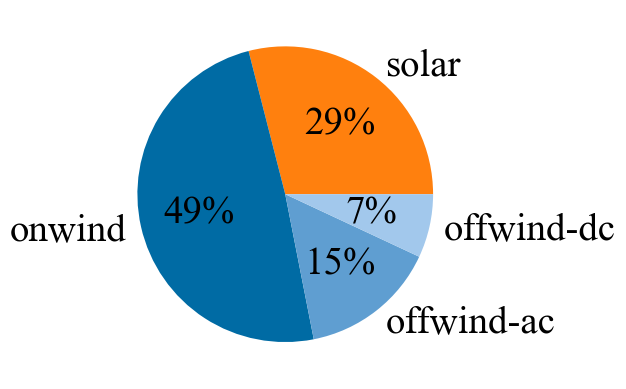

In [38]:
values = [n.generators_t.p_max_pu.filter(like=name, axis=1).sum().sum() for name in feature_names]
plt.pie(values, labels=feature_names, colors=feature_colors, autopct='%1.0f%%', pctdistance=0.6)
plt.savefig(f"plots/simple_p_max_pu_pieChart.pdf", format="pdf", bbox_inches="tight")

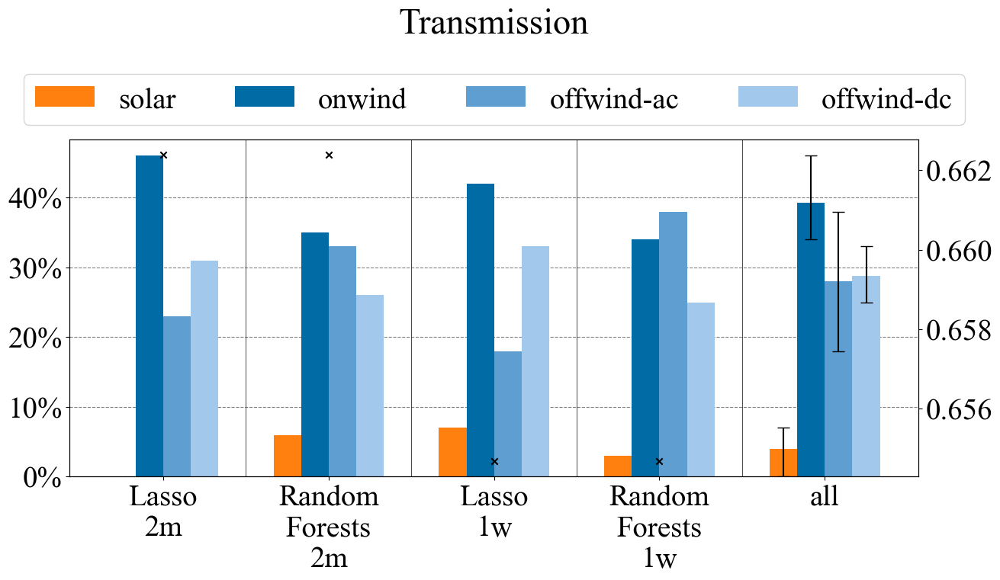

In [87]:
simple_experiment.plot_one_result('Transmission')

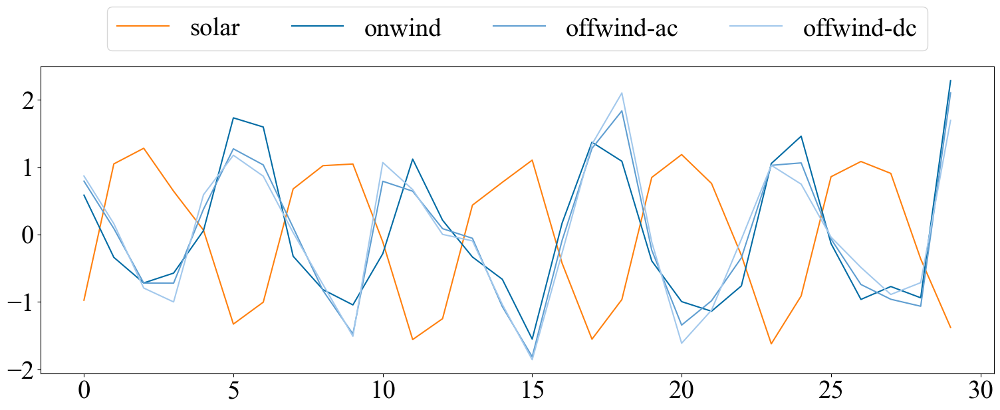

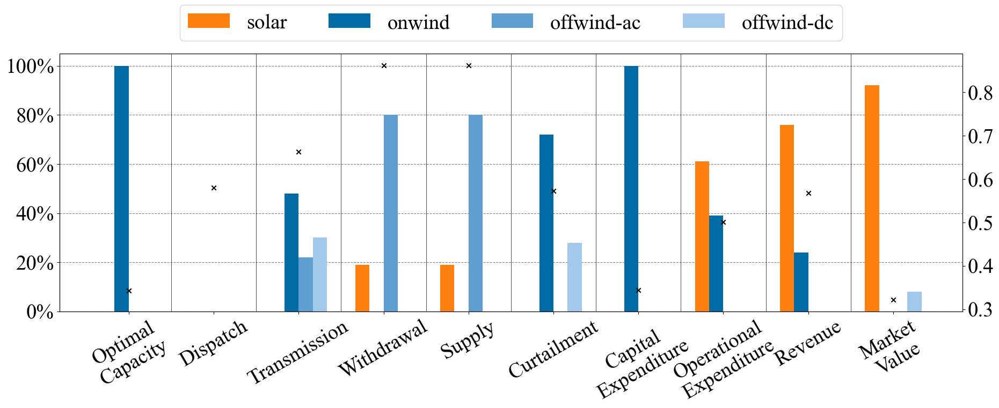

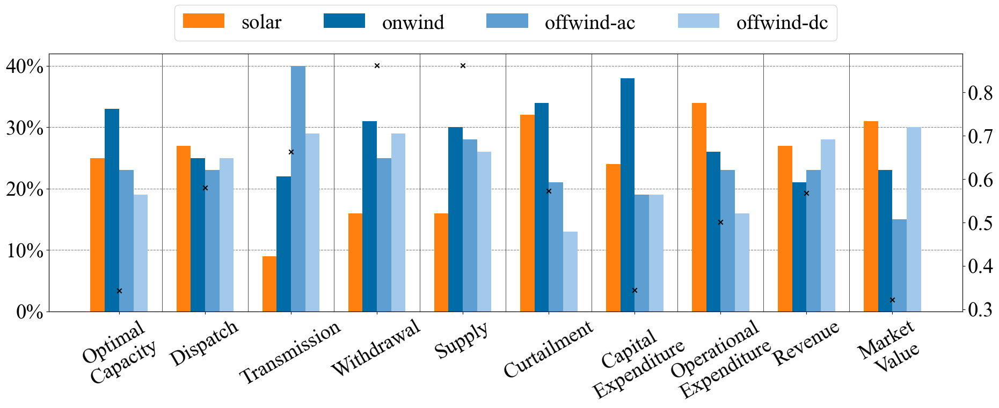

In [29]:
simple_experiment.plot_features('2m')
simple_experiment.plot_results('2m')

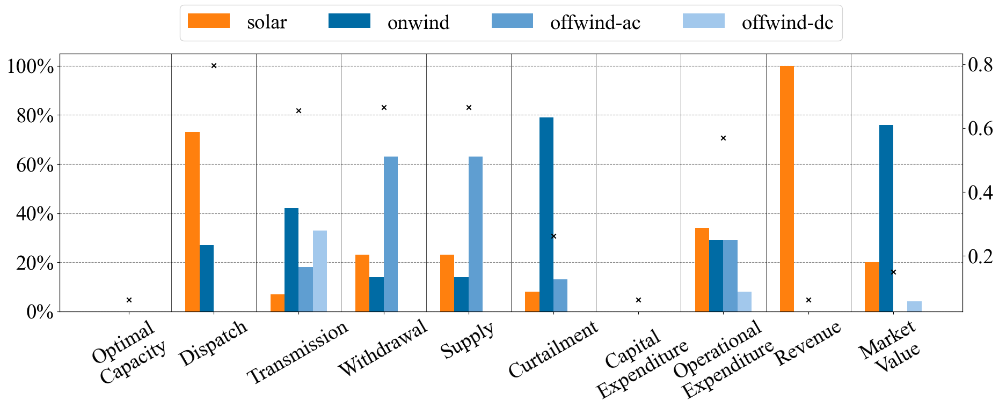

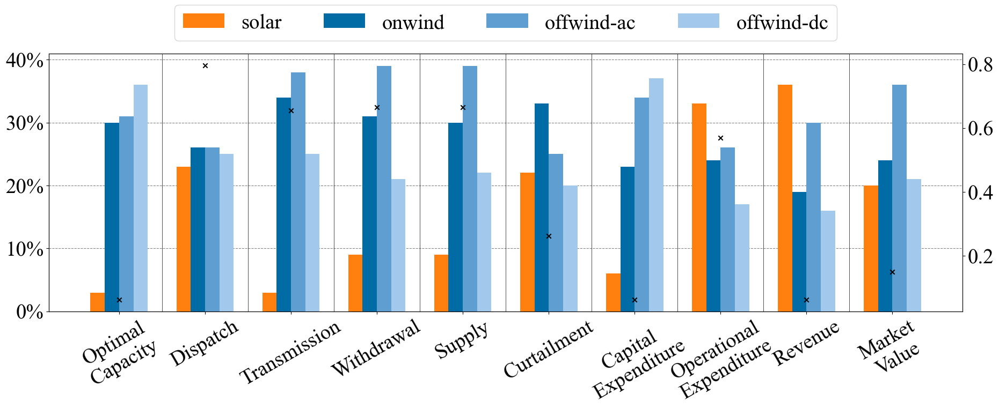

In [92]:
simple_experiment.plot_results('1w')

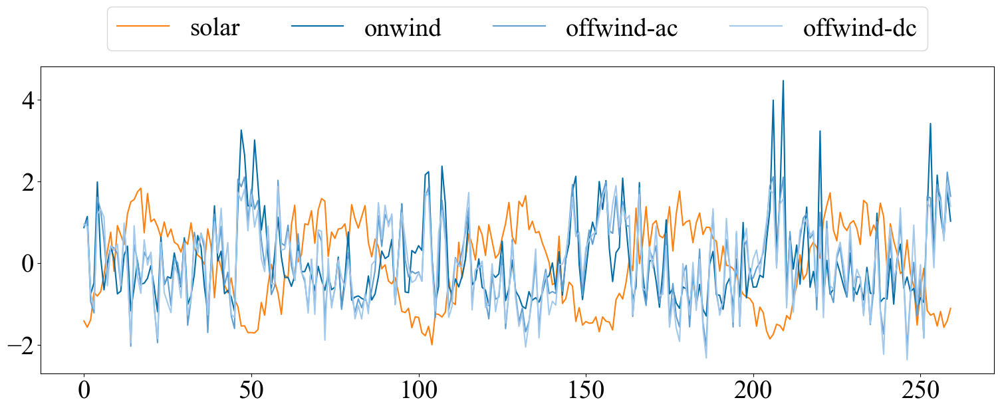

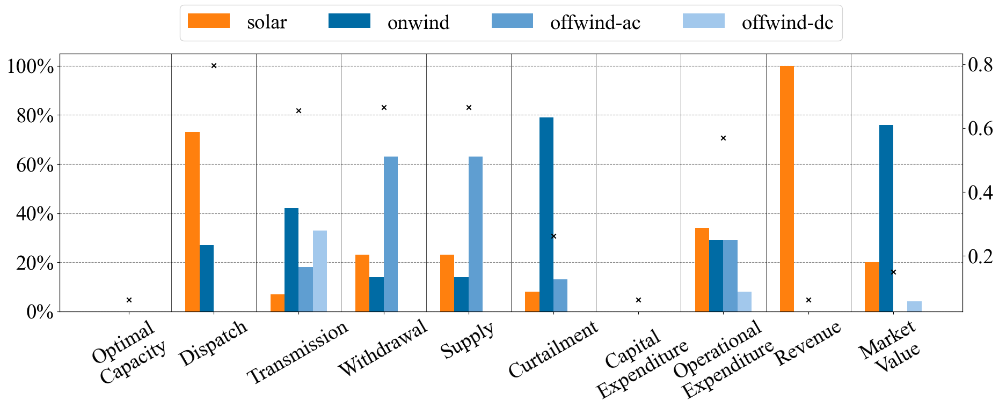

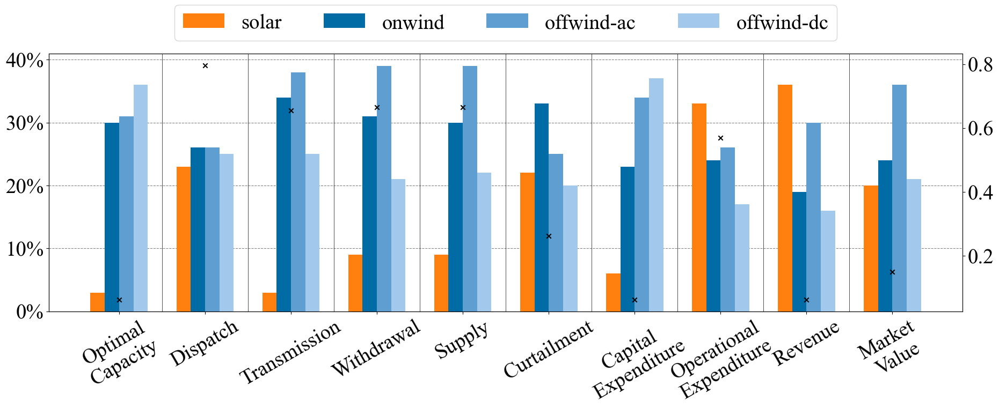

In [93]:
simple_experiment.plot_features('1w')
simple_experiment.plot_results('1w')

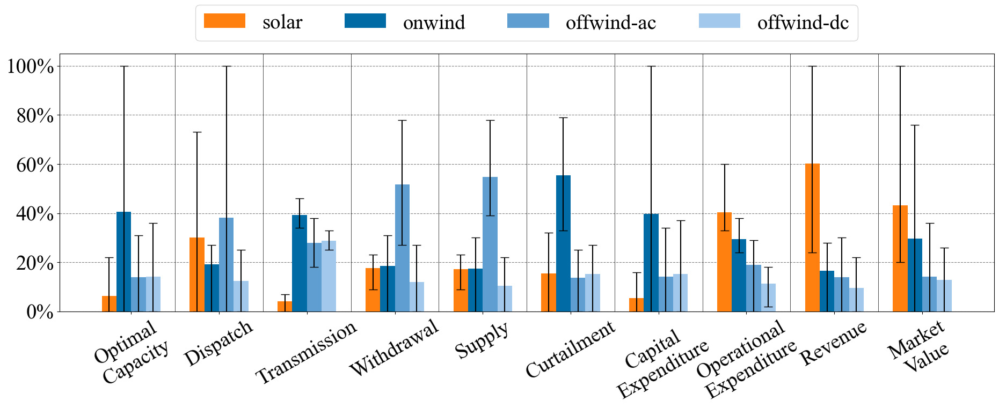

In [95]:
simple_experiment.plot_all_results()

## generators and location

Divide generators into features and calculate mean:

In [7]:
generators = ['solar', 'wind']
location_split_x = 10
location_split_y = 51

def get_location_features(netw: pypsa.Network, *args):
    feature_data = netw.generators_t.p_max_pu
    feature_array = []
    for generator in generators:
        df_generator = feature_data.filter(like=generator, axis=1)
        location_array = [[], [], [], []]
        for column in df_generator:
            bus = column.rpartition(' ')[0]
            if netw.buses['y'][bus] > location_split_y:
                if netw.buses['x'][bus] <= location_split_x:
                    location_array[0].append(np.mean(df_generator[column]))
                else:
                    location_array[1].append(np.mean(df_generator[column]))
            else: 
                if netw.buses['x'][bus] <= location_split_x:
                    location_array[2].append(np.mean(df_generator[column]))
                else:
                    location_array[3].append(np.mean(df_generator[column]))
        for a in location_array:
            if len(a) == 0:
                feature_array.append(0)
            else: 
                feature_array.append(np.mean(a))
    return feature_array

Create and run Experiment:

In [8]:
location_feature_names = [g+' ' + y+x for g in ['solar', 'wind'] for y in ['north', 'south'] for x in ['west', 'east']]
feature_colors = [colors['orange'+str(i+1)] for i in range(4)] + [colors['blue'+str(i+1)] for i in range(4)]

location_experiment = Experiment('location', netw_splits, result_vectors)
location_experiment.create_features(get_location_features, location_feature_names, feature_colors)
location_experiment.run_algorithms()

Plot the Results:

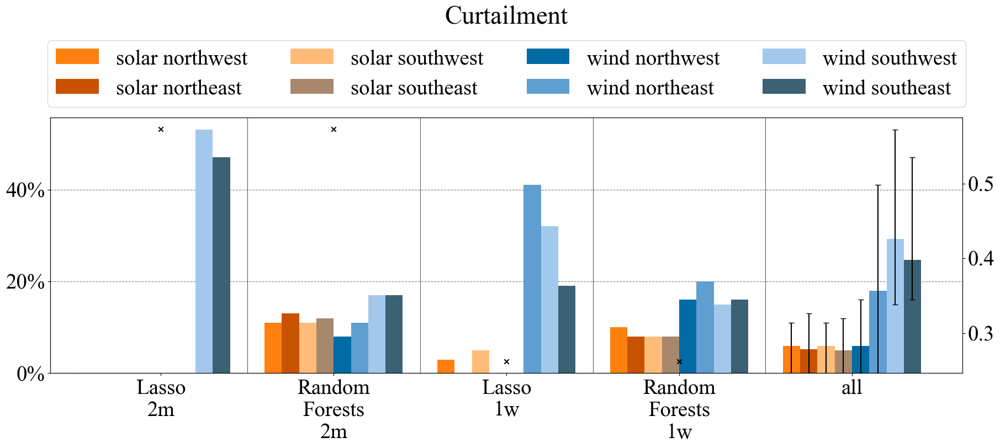

In [18]:
location_experiment.plot_one_result('Curtailment')

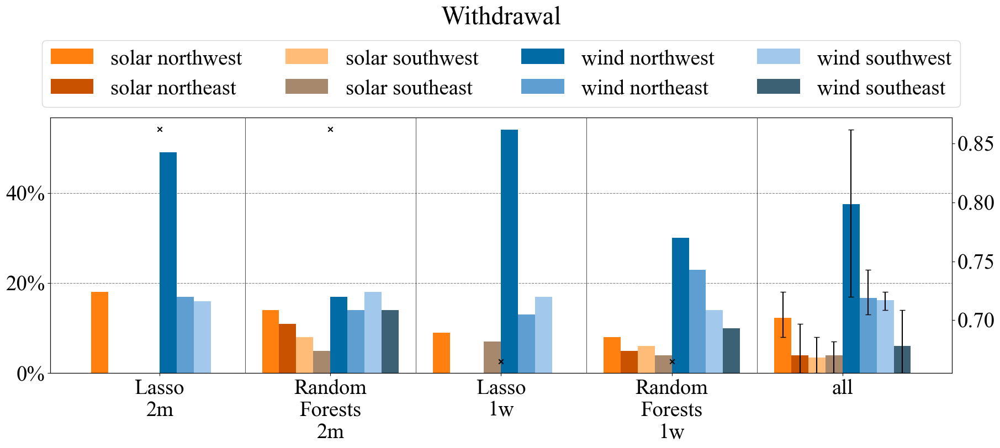

In [17]:
location_experiment.plot_one_result('Withdrawal')

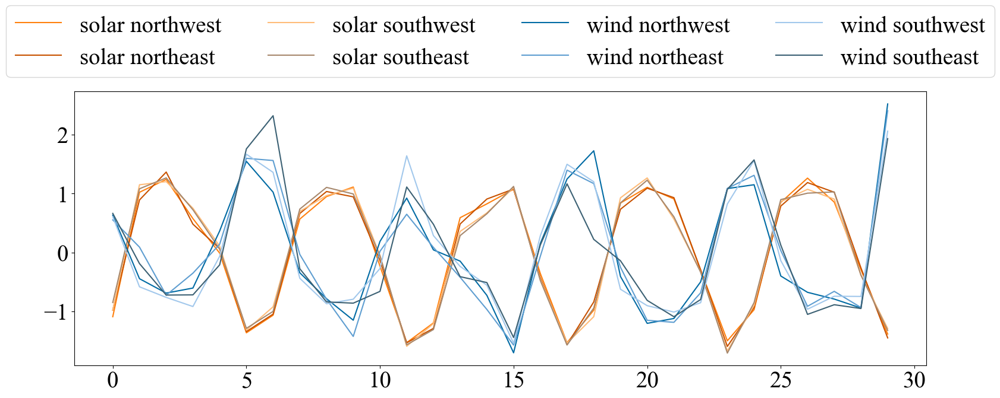

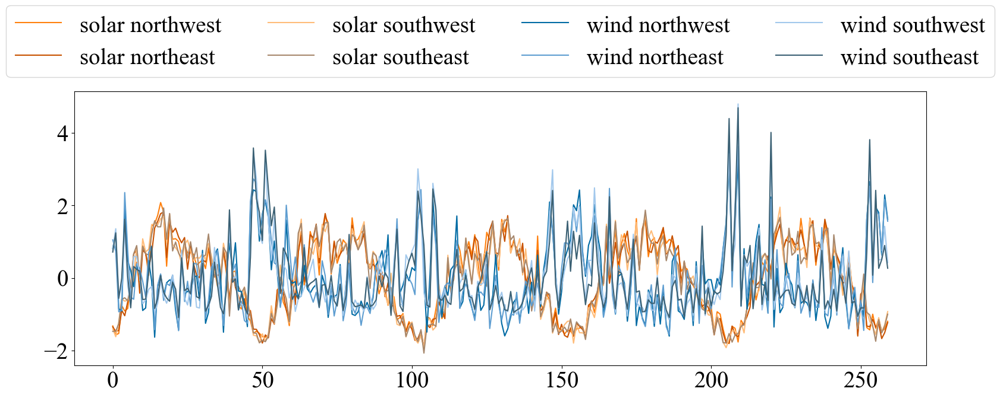

In [10]:
location_experiment.plot_features('2m')
location_experiment.plot_features('1w')

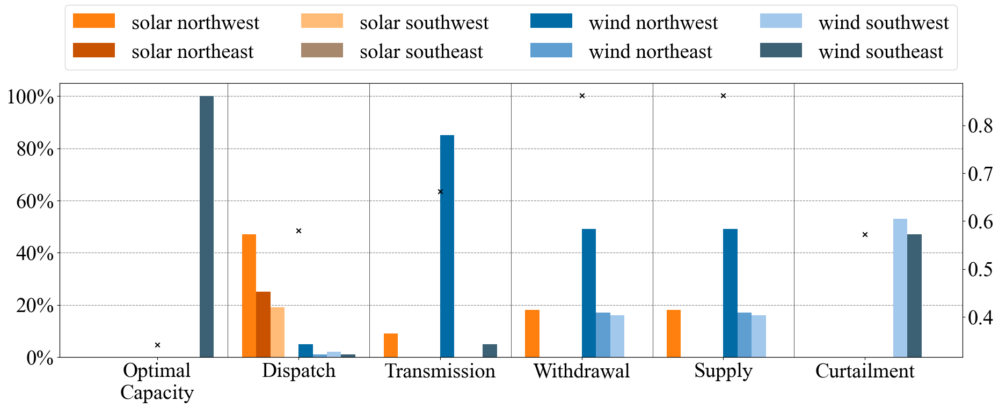

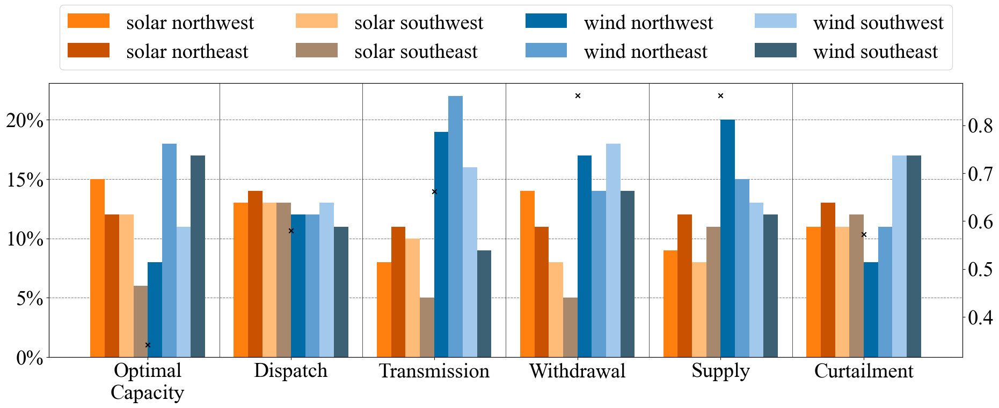

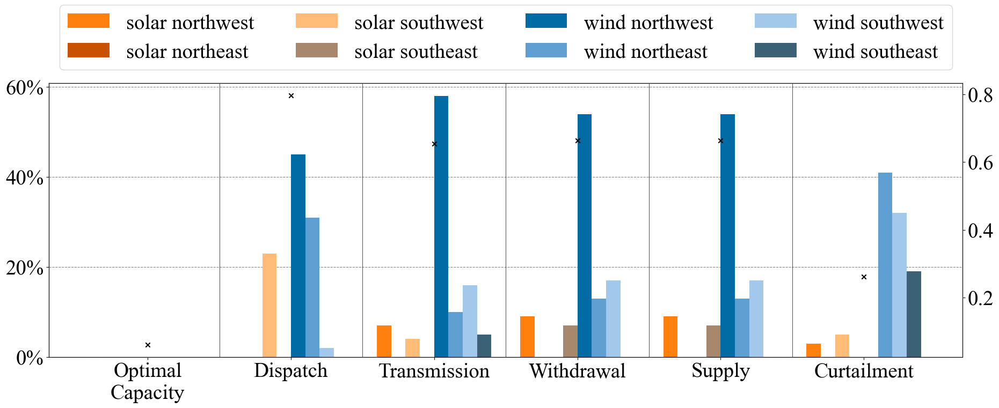

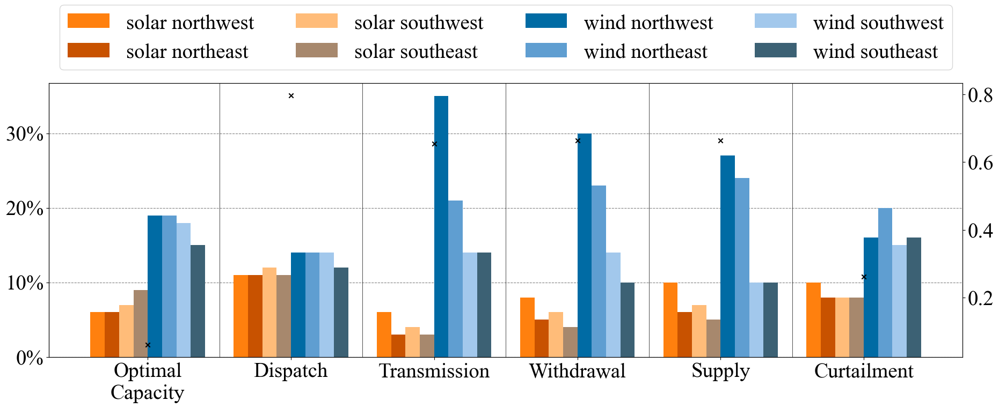

In [11]:
location_experiment.plot_results('2m', ['Optimal Capacity', 'Dispatch', 'Transmission', 'Withdrawal', 'Supply', 'Curtailment'], text_rotation=0)
location_experiment.plot_results('1w', ['Optimal Capacity', 'Dispatch', 'Transmission', 'Withdrawal', 'Supply', 'Curtailment'], text_rotation=0)

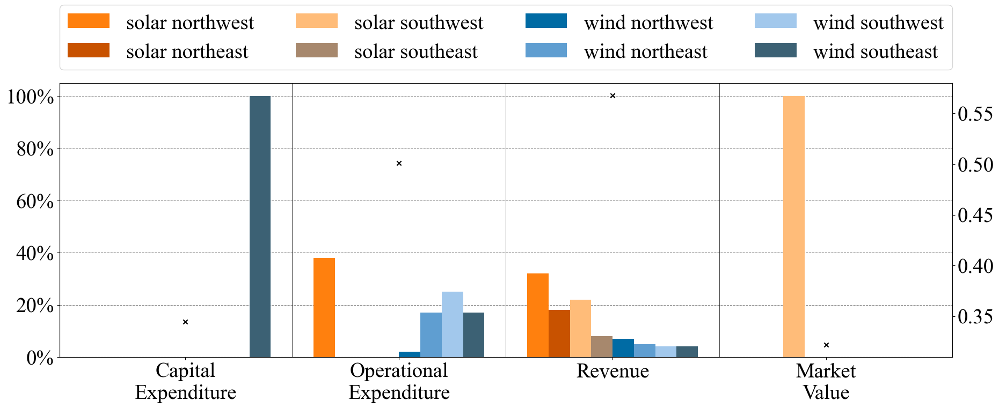

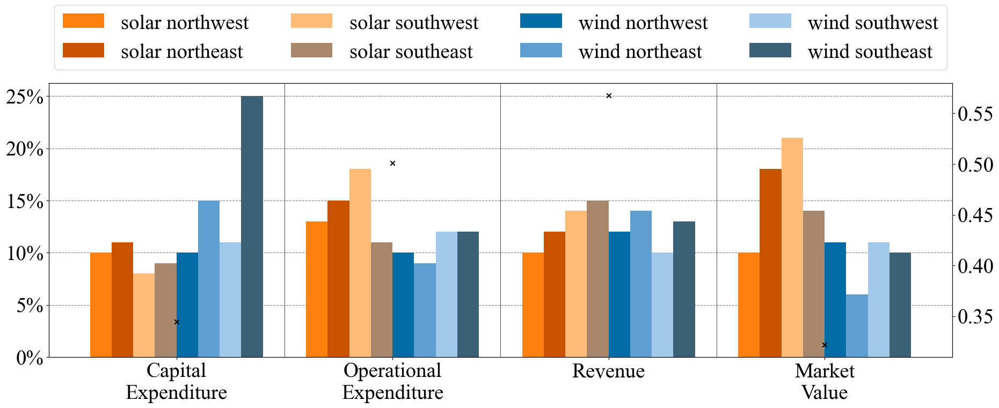

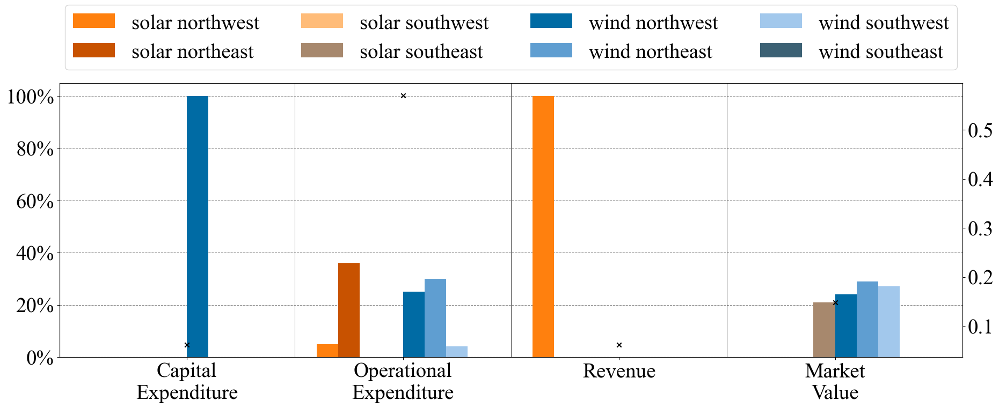

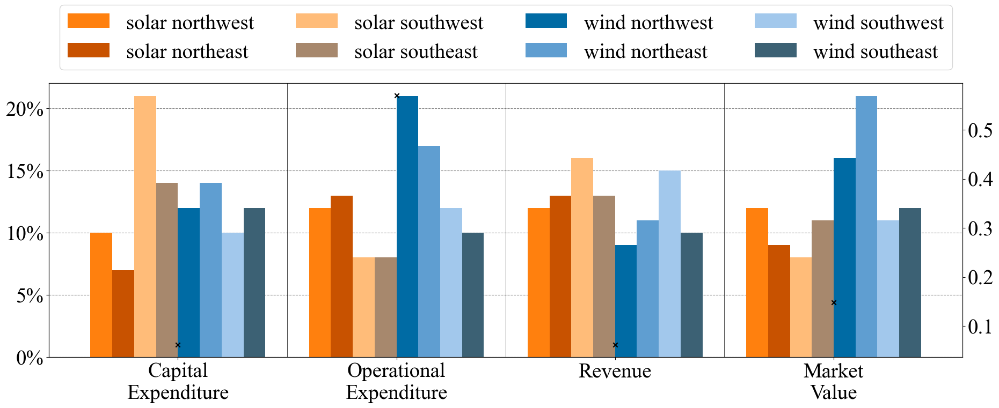

In [12]:
location_experiment.plot_results('2m', ['Capital Expenditure', 'Operational Expenditure', 'Revenue', 'Market Value'], text_rotation=0)
location_experiment.plot_results('1w', ['Capital Expenditure', 'Operational Expenditure', 'Revenue', 'Market Value'], text_rotation=0)

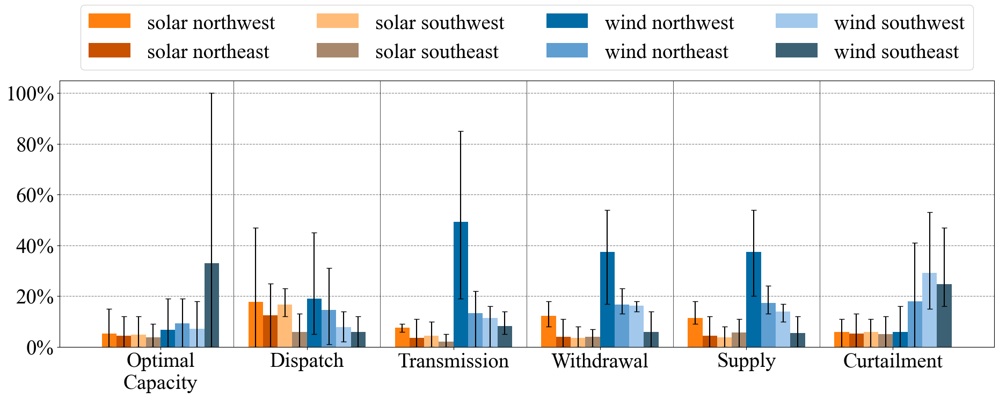

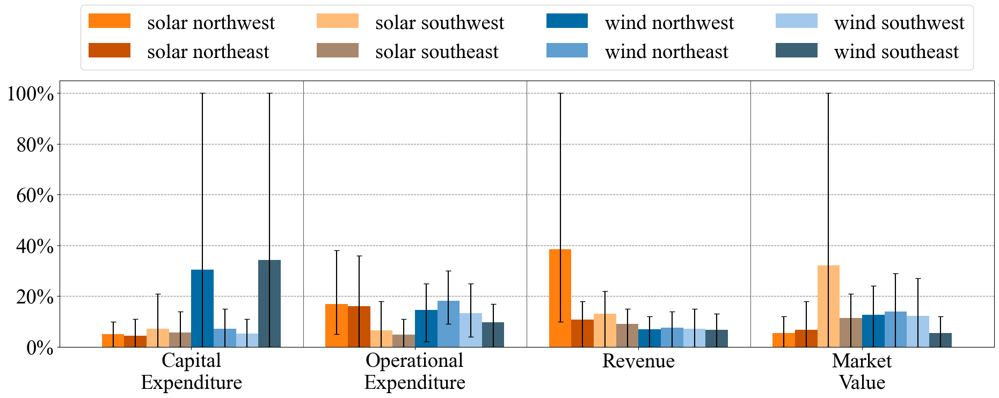

In [13]:
location_experiment.plot_all_results(['Optimal Capacity', 'Dispatch', 'Transmission', 'Withdrawal', 'Supply', 'Curtailment'], text_rotation=0)
location_experiment.plot_all_results(['Capital Expenditure', 'Operational Expenditure', 'Revenue', 'Market Value'], text_rotation=0)

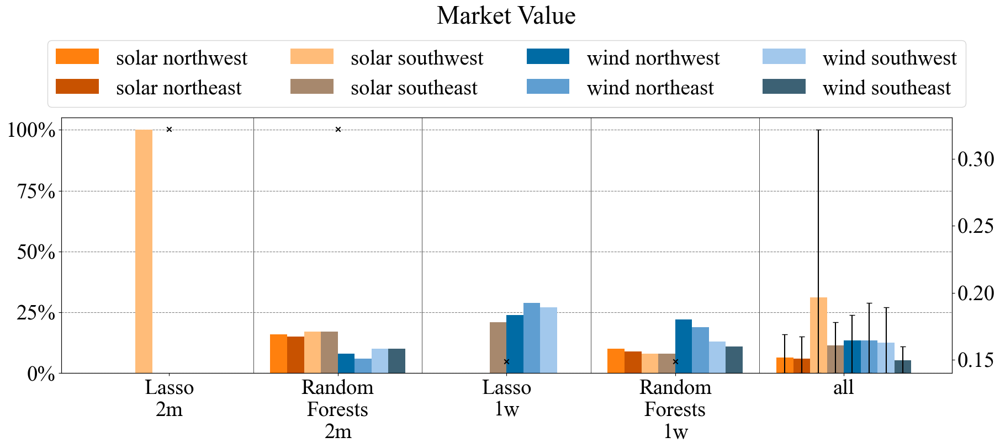

In [41]:
location_experiment.plot_one_result('Market Value')

## weather data

In [9]:
def get_weather_feature_array(filename: str, feature_keys=None):
    with open(filename, 'rb') as f:
        weather_features = pickle.load(f)
    if feature_keys is None:
        feature_keys = ['wnd100m', 'wnd_azimuth', 'roughness', 'influx_toa', 'influx_direct', 'influx_diffuse', 'albedo', 'solar_altitude', 'solar_azimuth', 'temperature', 'soil temperature', 'runoff']

    feature_array = np.array([weather_features[key] for key in feature_keys]).T
    feature_scaler = StandardScaler().fit(feature_array)
    feature_array = feature_scaler.transform(feature_array)
    return feature_array

### 2 month - all

In [1]:
possible_feature_keys = ['wnd100m', 'wnd_azimuth', 'roughness', 'influx_toa', 'influx_direct', 'influx_diffuse', 'albedo', 'solar_altitude', 'solar_azimuth', 'temperature', 'soil temperature', 'runoff']

### wind,influx,tempr

Create and run Experiment:

In [25]:
feature_names = ['wnd100m','influx_direct', 'influx_diffuse', 'temperature']
feature_colors = [colors['blue1'], colors['orange1'], colors['orange2'], colors['grey2']]
feature_matrix_2m = get_weather_feature_array('weather_features.pkl', feature_names)
feature_matrix_1w = get_weather_feature_array('weather_features_1w.pkl', feature_names)
feature_matrices = {'2m': feature_matrix_2m, '1w': feature_matrix_1w}

weather_experiment = Experiment('weather_wind,influx,tempr', netw_splits, result_vectors, feature_matrices, feature_names, feature_colors)
weather_experiment.run_algorithms()

Plot results:

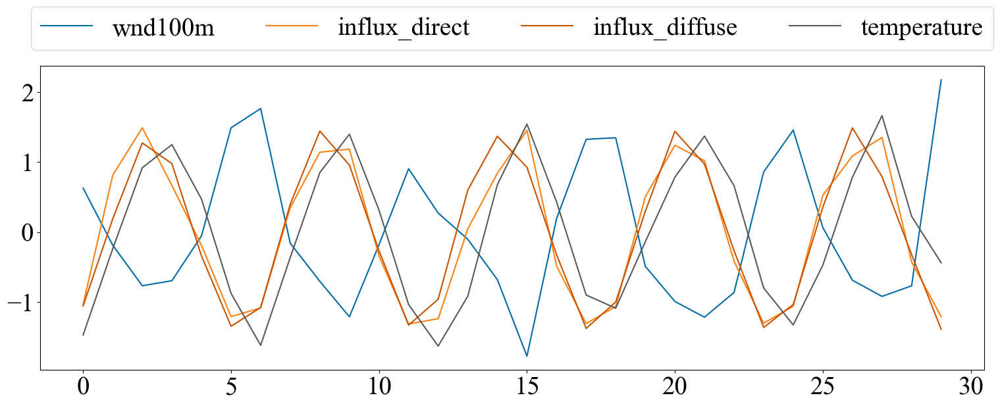

In [26]:
weather_experiment.plot_features('2m')

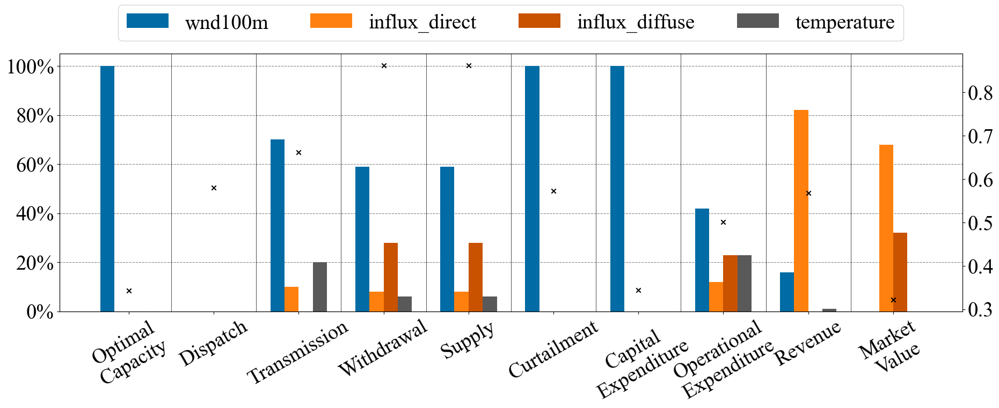

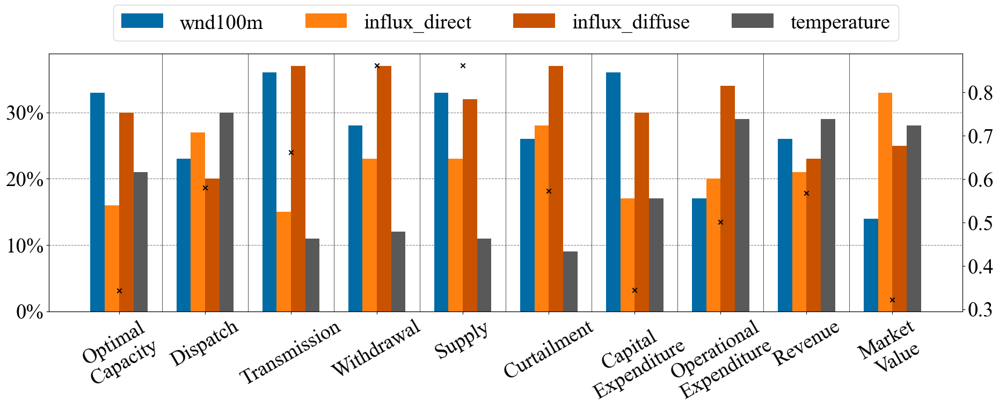

In [116]:
weather_experiment.plot_results('2m')

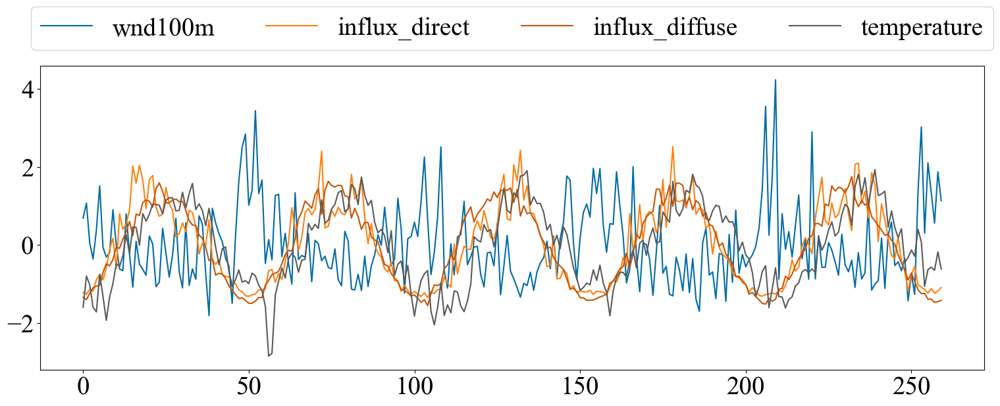

In [117]:
weather_experiment.plot_features('1w')

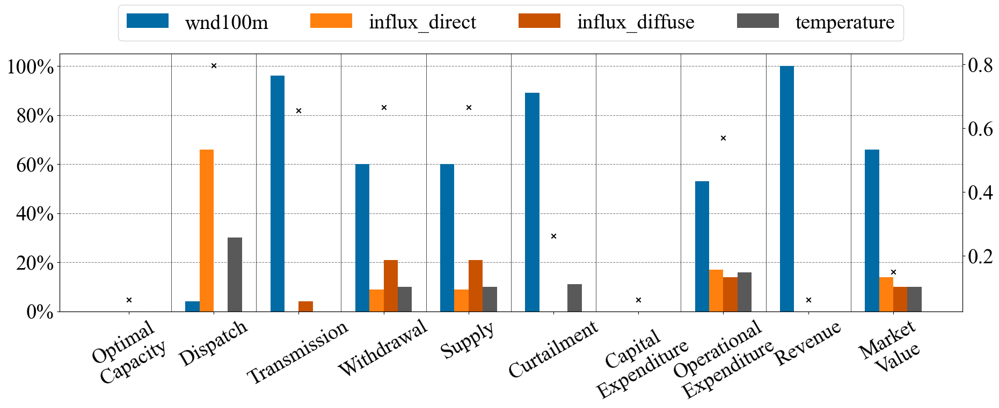

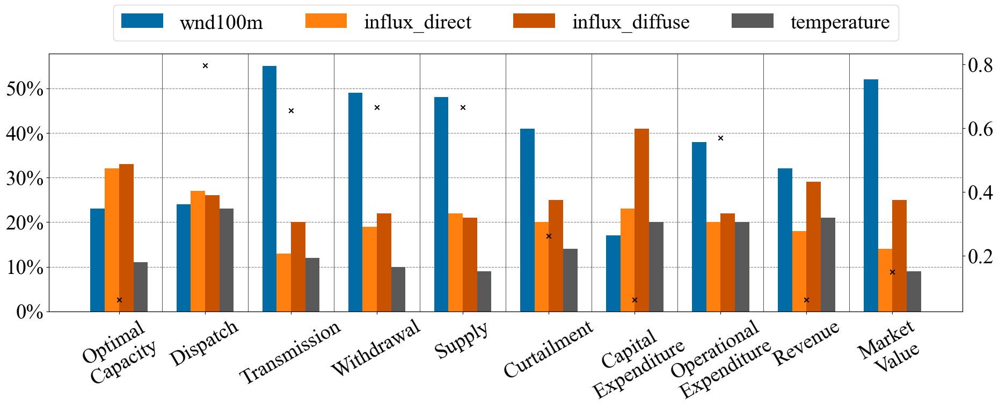

In [118]:
weather_experiment.plot_results('1w')

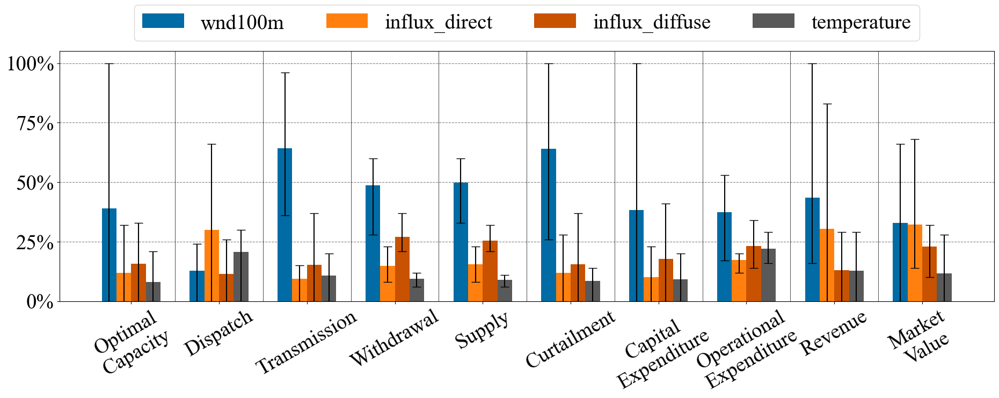

In [119]:
weather_experiment.plot_all_results()

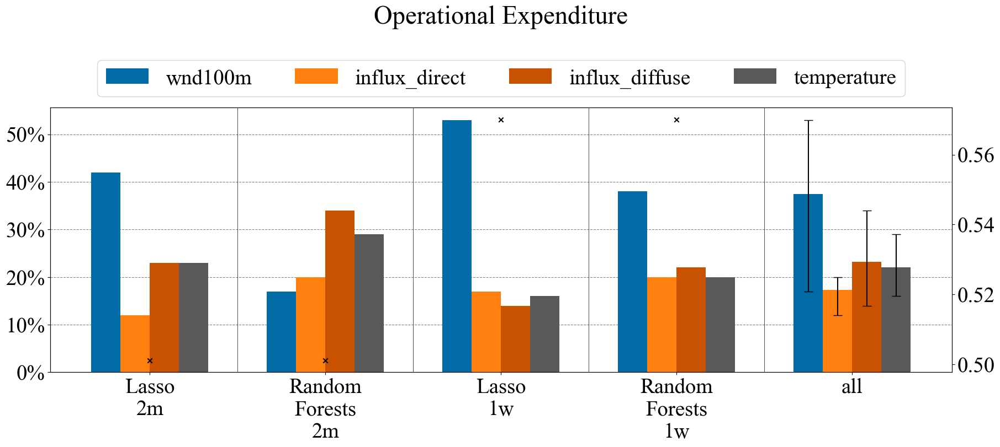

In [137]:
weather_experiment.plot_one_result('Operational Expenditure')

## weather solar

Create and run Experiment:

In [42]:
feature_names = ['influx_direct', 'influx_diffuse', 'solar_altitude', 'temperature']
feature_colors = [colors['orange1'], colors['orange2'], colors['orange3'], colors['grey2']]
feature_matrix_2m = get_weather_feature_array('weather_features.pkl', feature_names)
feature_matrix_1w = get_weather_feature_array('weather_features_1w.pkl', feature_names)
feature_matrices = {'2m': feature_matrix_2m, '1w': feature_matrix_1w}

weather_solar_experiment = Experiment('weather_solar', netw_splits, result_vectors, feature_matrices, feature_names, feature_colors)
weather_solar_experiment.run_algorithms()

Plot Results:

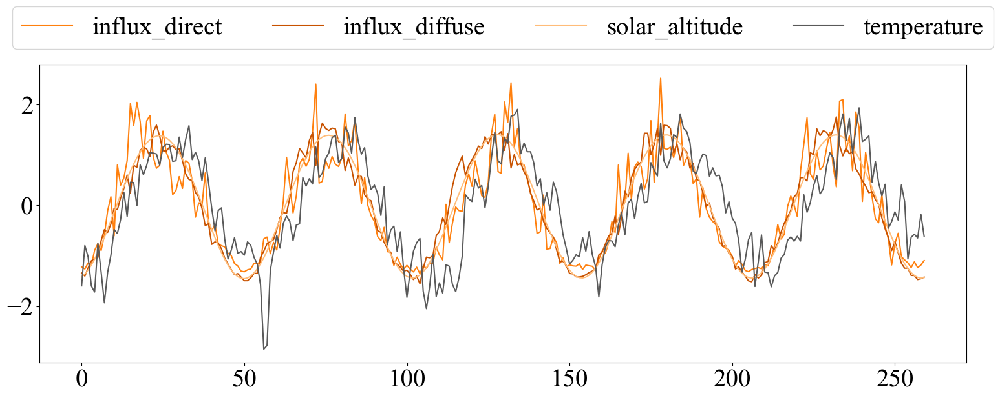

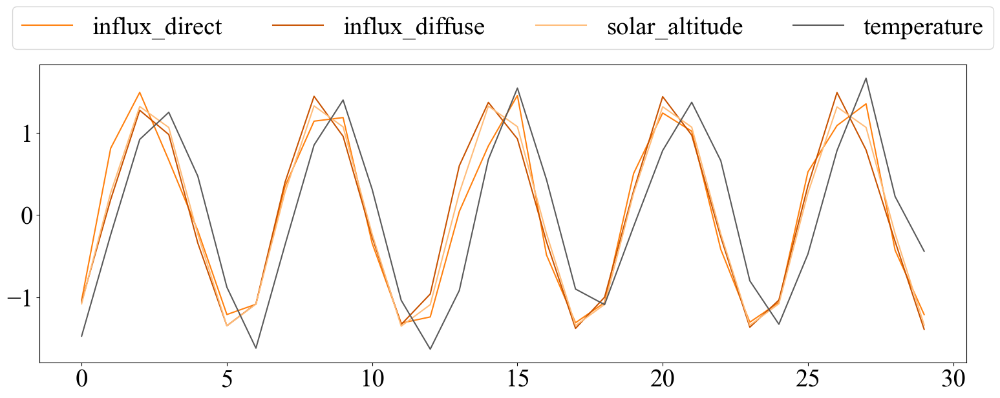

In [43]:
weather_solar_experiment.plot_features('1w')
weather_solar_experiment.plot_features('2m')

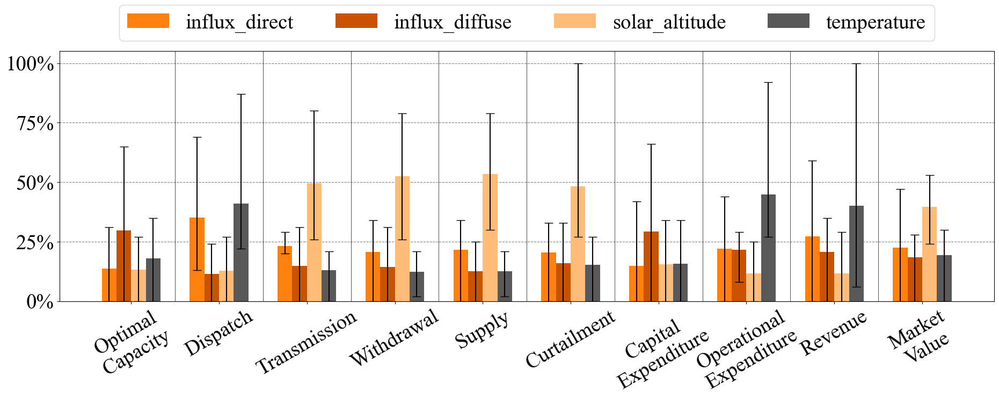

In [44]:
weather_solar_experiment.plot_all_results()

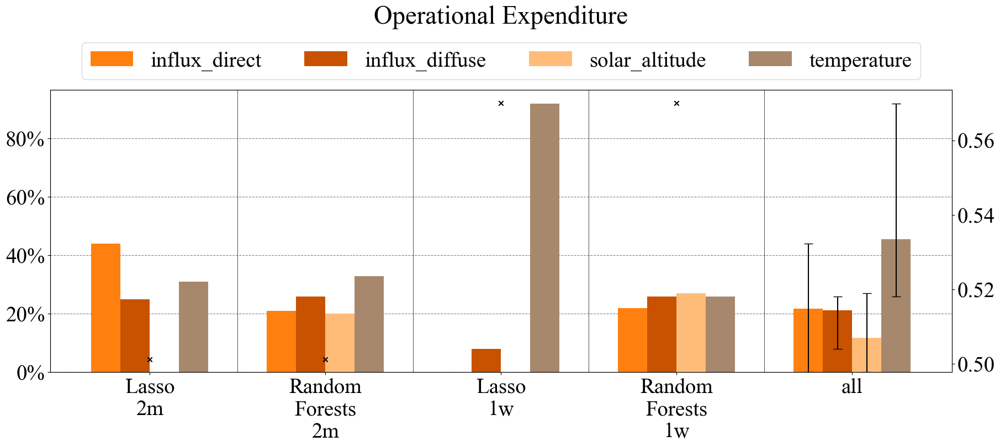

In [40]:
weather_solar_experiment.plot_one_result('Operational Expenditure')

### wind location

Create Experiment:

In [38]:
def import_wind_features(file_name):
    with open(f'{file_name}.pkl', 'rb') as f:
        features = pickle.load(f)
    names = list(features.keys())
    matrix = np.array([features[key] for key in names]).T
    scaler = StandardScaler().fit(matrix)
    matrix = scaler.transform(matrix)
    return names, matrix

feature_names, feature_matrix_2m = import_wind_features('weather_features_wind_2m')
feature_names, feature_matrix_1w = import_wind_features('weather_features_wind_1w')
feature_matrices = {'2m': feature_matrix_2m, '1w': feature_matrix_1w}
feature_colors = [colors['blue' + str(n)] for n in range(1, 5)]

wind_experiment = Experiment('weather_wind', netw_splits, result_vectors, feature_matrices, feature_names, feature_colors)
wind_experiment.run_algorithms()

Plot results:

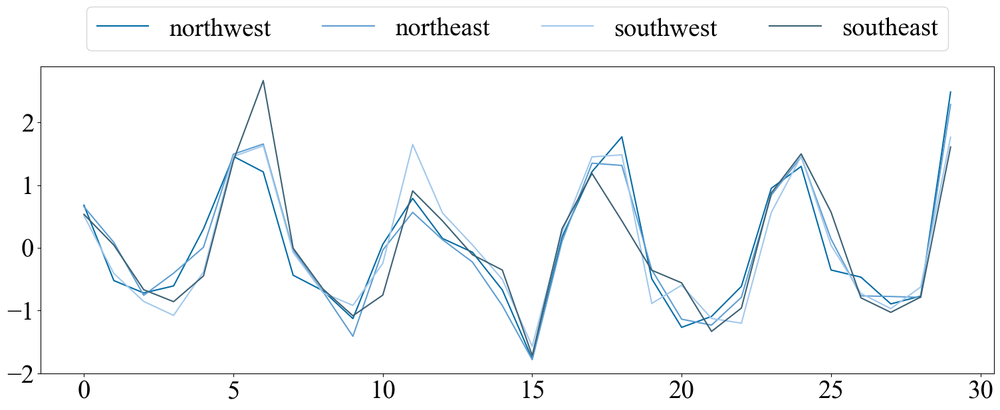

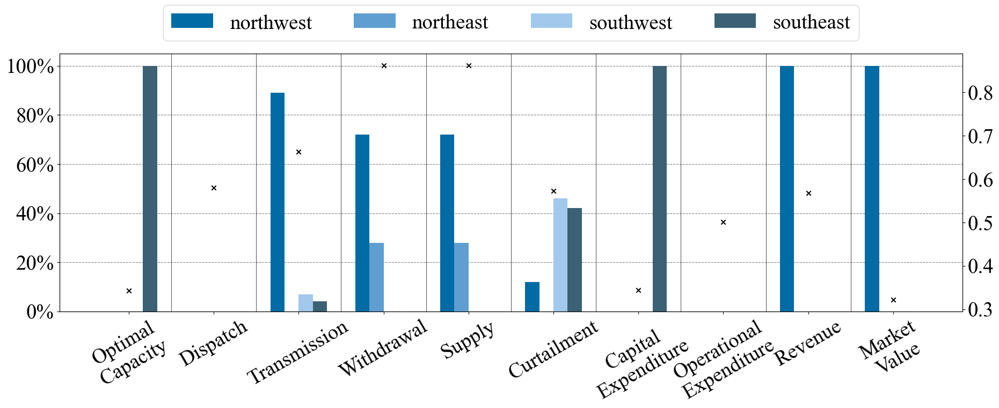

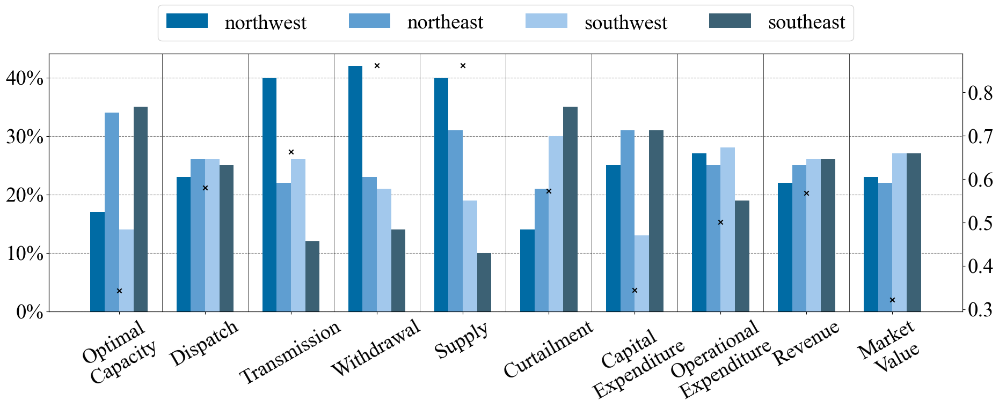

In [39]:
wind_experiment.plot_features('2m')
wind_experiment.plot_results('2m')

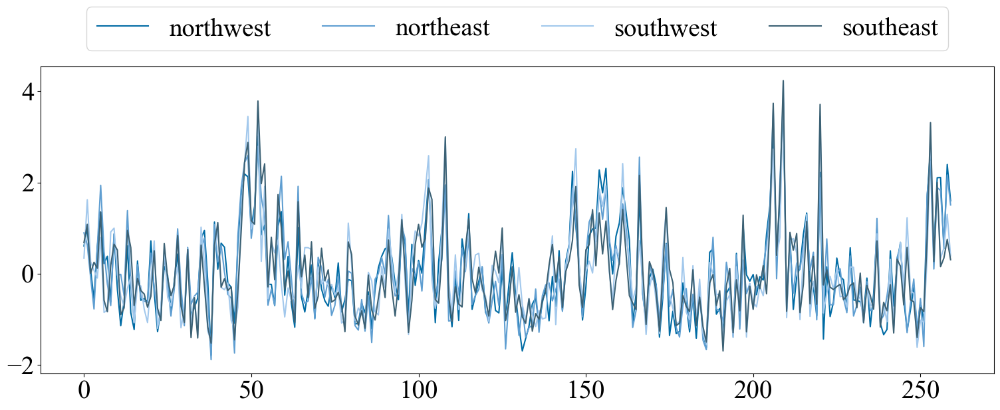

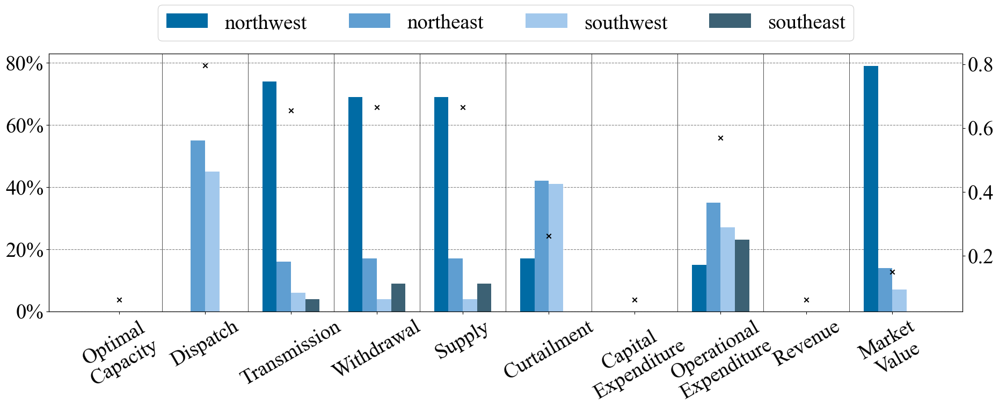

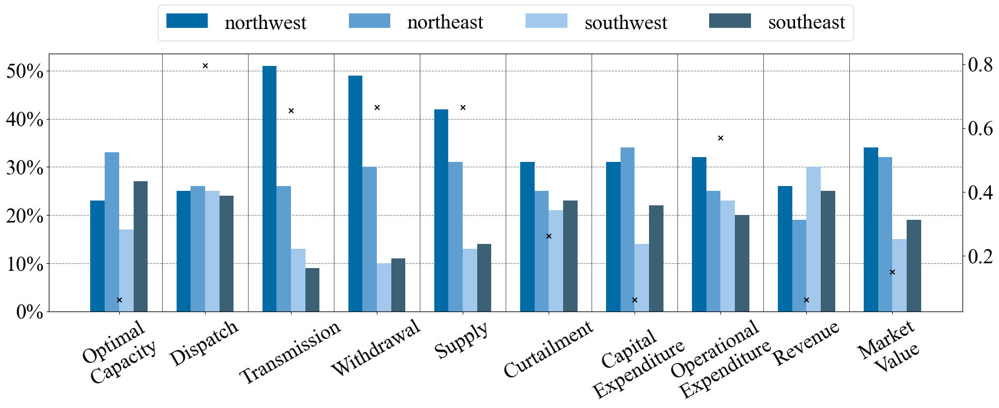

In [40]:
wind_experiment.plot_features('1w')
wind_experiment.plot_results('1w')

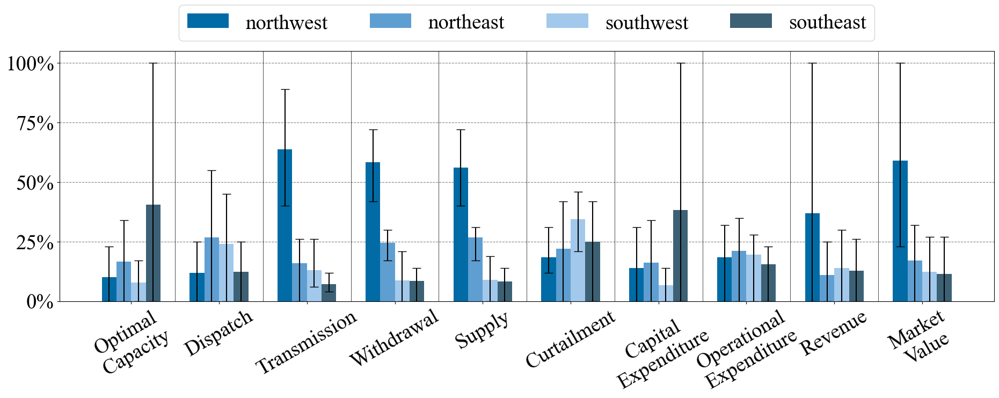

In [41]:
wind_experiment.plot_all_results()

## time

In [11]:
def get_month_feature(netw: pypsa.Network, *args):
    timestamp = netw.snapshots[int(len(netw.snapshots)/2)]
    features = np.zeros(6)
    features[int((timestamp.month-1)/2)] = 1
    return features

In [77]:
time_experiment = Experiment('time', netw_splits, result_vectors)

feature_names=['Jan/Feb', 'Mar/Apr', 'May/Jun', 'Jul/Aug', 'Sep/Oct', 'Nov/Dec']
feature_colors=[colors['blue1'], colors['grey2'], colors['orange1'], colors['orange2'], colors['grey1'], colors['blue2']]
time_experiment.create_features(get_month_feature, feature_names, feature_colors)
time_experiment.run_algorithms()

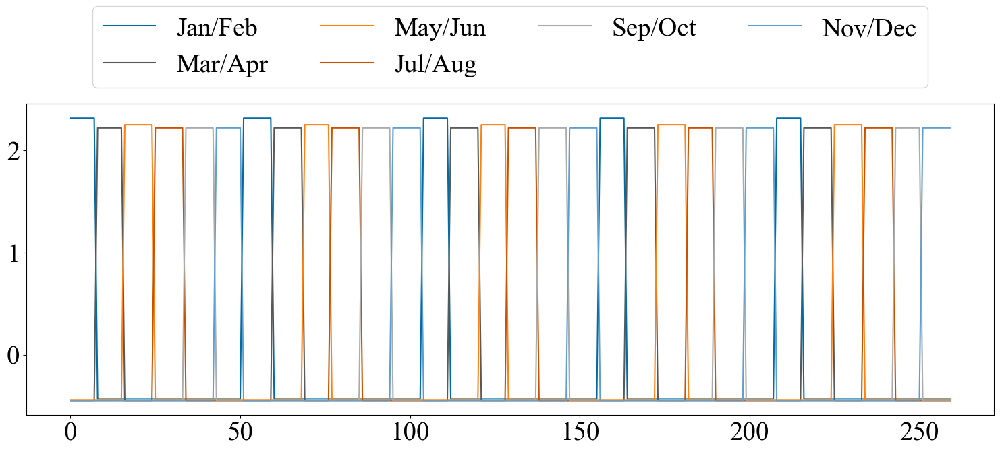

In [78]:
time_experiment.plot_features('1w')

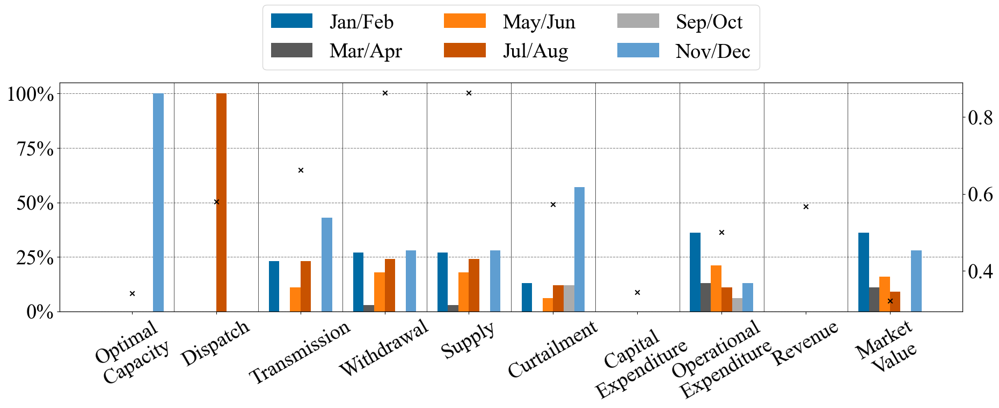

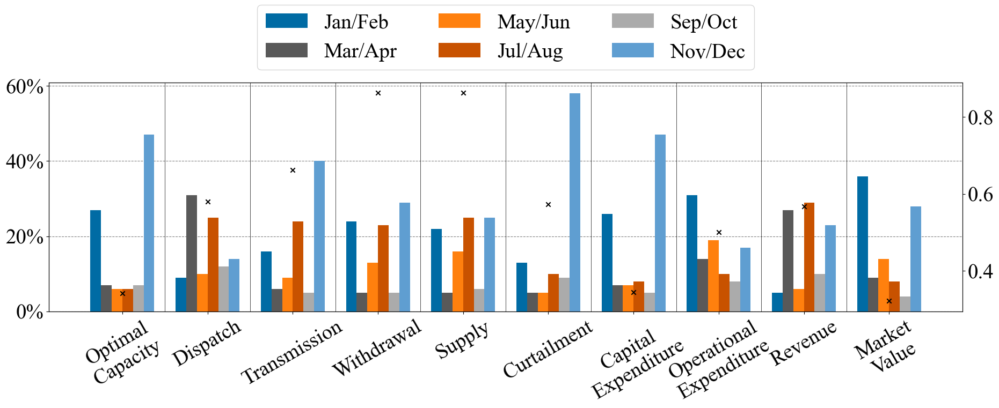

In [91]:
time_experiment.plot_results('2m')

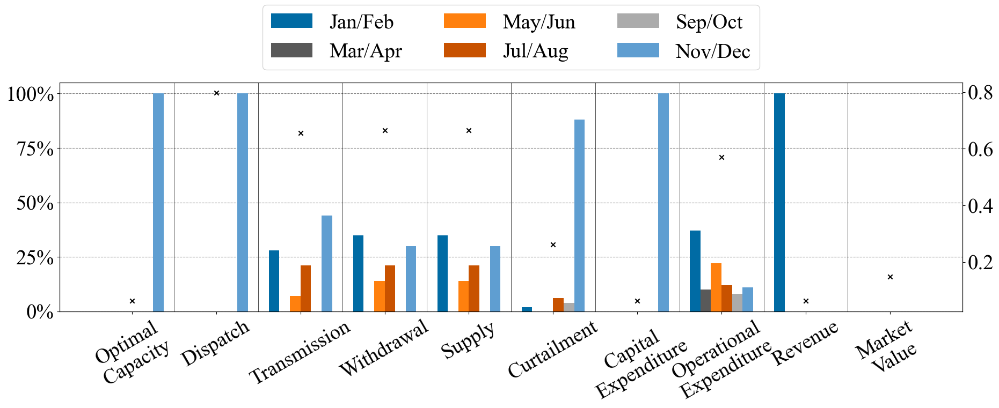

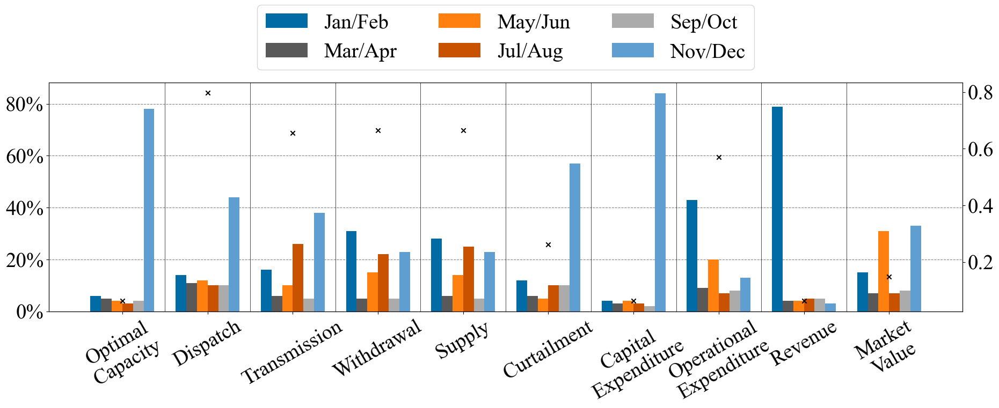

In [96]:
time_experiment.plot_results('1w')

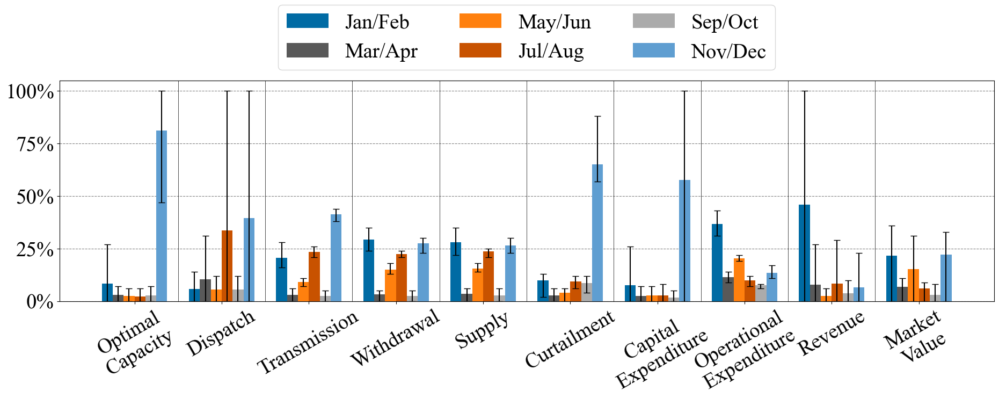

In [104]:
time_experiment.plot_all_results()

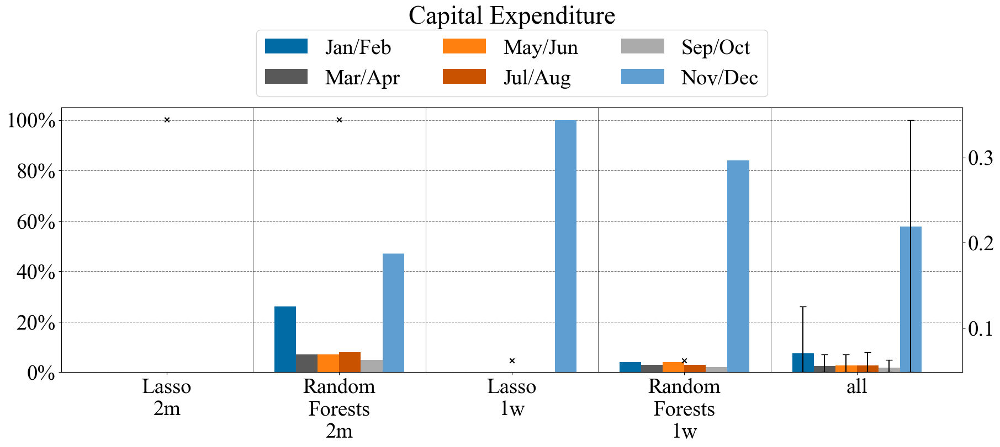

In [141]:
time_experiment.plot_one_result('Capital Expenditure')

In [ ]:
time_experiment

## time and weather

In [72]:
weather_feature_names = ['wnd100m','influx_direct', 'influx_diffuse', 'temperature']
weather_features = {'2m': get_weather_feature_array('weather_features.pkl', weather_feature_names), 
                    '1w': get_weather_feature_array('weather_features_1w.pkl', weather_feature_names)}

def get_month_weather_feature(netw: pypsa.Network, i, split):
    #get weather features and
    features = list(weather_features[split][i])
    features[1] += features[2]
    del features[2]
    # add feature if its dec/nov
    timestamp = netw.snapshots[int(len(netw.snapshots)/2)]
    features.append(int(int((timestamp.month-1)/2) == 5))
    return features

In [73]:
weather_time_experiment = Experiment('time&weather', netw_splits, result_vectors)

feature_names=['wnd100m', 'influx', 'temperature', 'Nov/Dec']
feature_colors=[colors['blue1'], colors['orange1'], colors['grey2'], colors['blue2']]
weather_time_experiment.create_features(get_month_weather_feature, feature_names, feature_colors)
weather_time_experiment.run_algorithms()

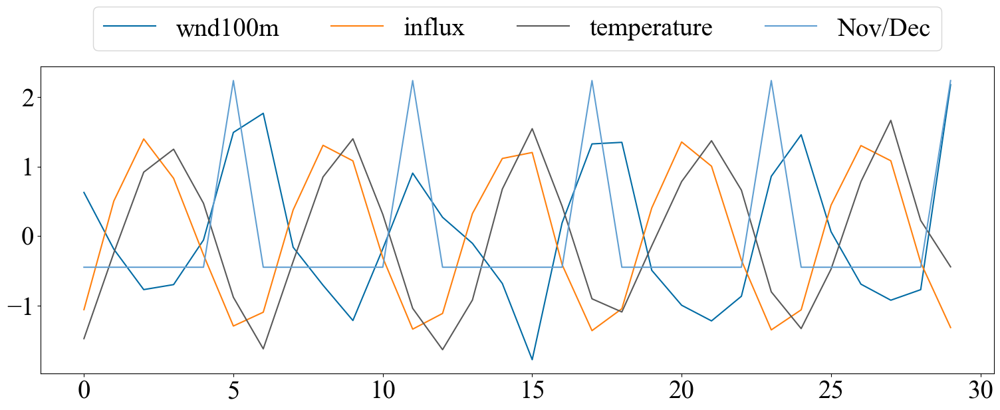

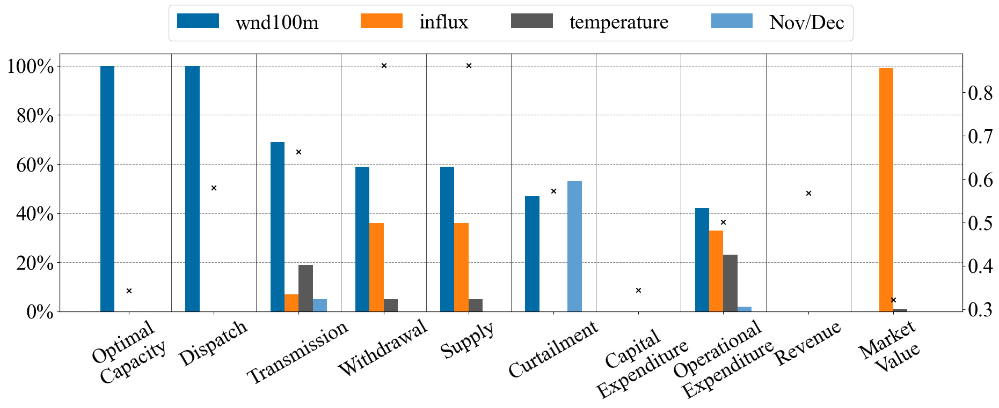

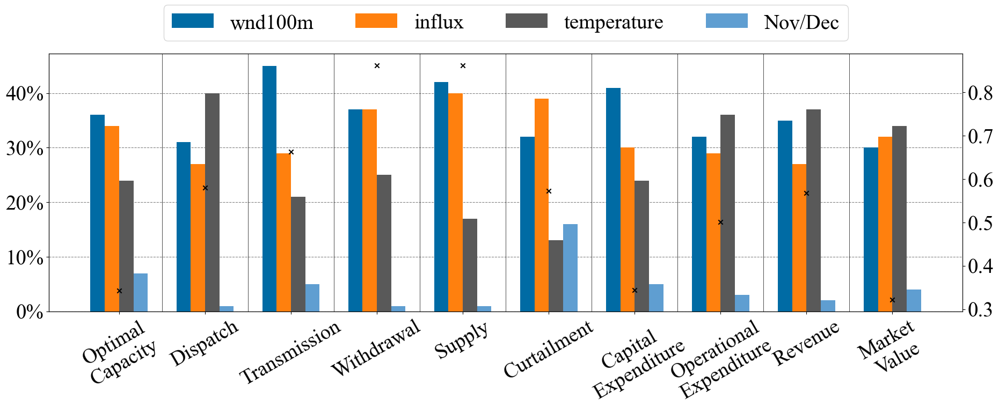

In [105]:
weather_time_experiment.plot_features('2m')
weather_time_experiment.plot_results('2m')

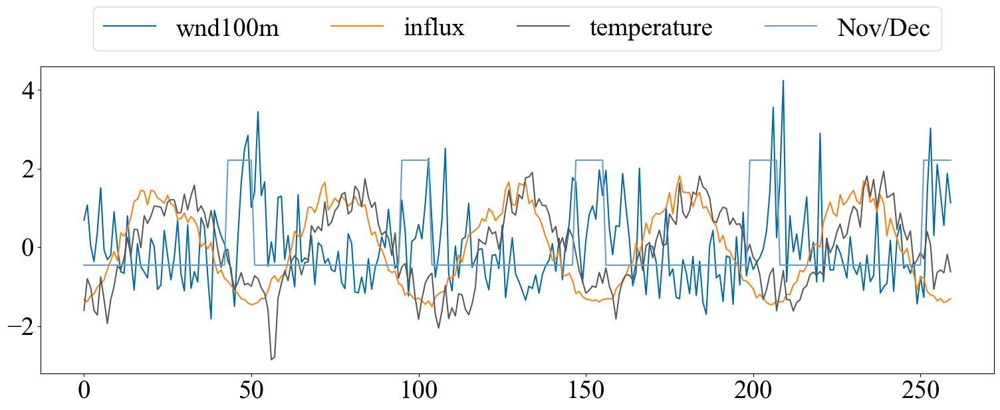

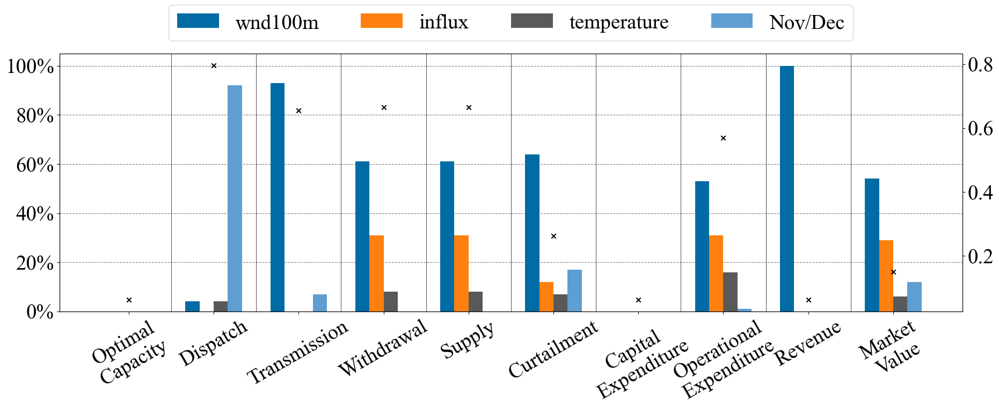

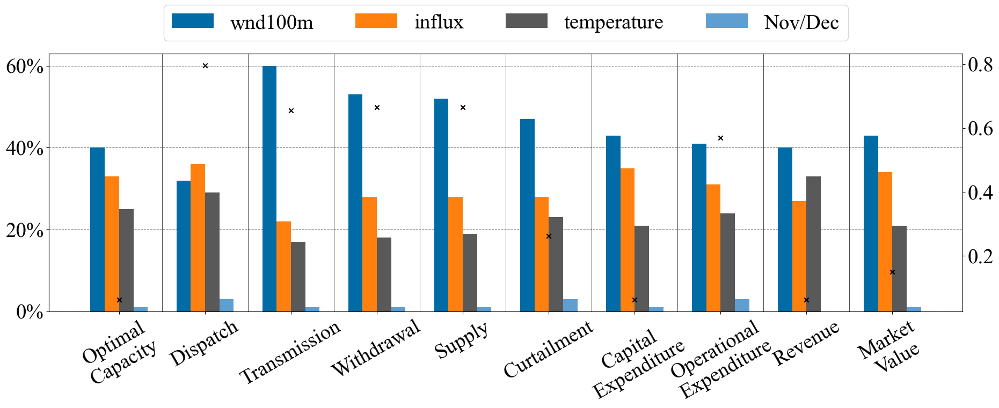

In [75]:
weather_time_experiment.plot_features('1w')
weather_time_experiment.plot_results('1w')

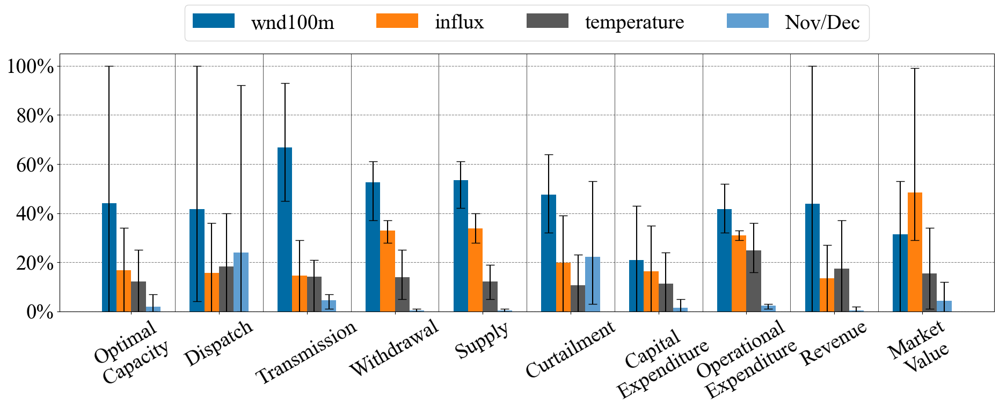

In [100]:
weather_time_experiment.plot_all_results()